<div style="border-left:4px solid #3D6FB0;padding:6px 0 8px 16px;"><div style="opacity:.72;font-size:12px;letter-spacing:1.4px;">Datos Masivos II · PRÁCTICA 1</div><div style="color:#3D6FB0;font-size:27px;font-weight:700;margin-top:4px;">Sección Dos: Hojas de Tomate</div><div style="opacity:.72;font-size:14px;margin-top:6px;margin-bottom:10px;">Equipo Tres: Castrillo Cruz Karen Arlet, Ramos González Nadia, Zamora Antiga Ángel Javier.</div><img src="https://mmss.iimas.unam.mx/dmmss/wp-content/uploads/2026/02/cropped-LogoUNAM_IIMAS_Negro50-scaled-2.png" width="200"/></div>

## Instrucciones 
Realizar una comparación entre: PCA, Non Negative Matrix y TSNE con los conjuntos de datos dados, así como una visualización de estos. 
Además, generar un clasificador o identificación de patrones, según sea el caso.

<div style="border-left:4px solid #524e64;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="color:#3D6FB0;font-size:21px;font-weight:700;">0. Contexto. Clasificación de Hojas de Tomate: Identificación de infecciones en huerta. </span></div>

La presencia de plagas en u otras enfermedades en huertos puede llegar a tener un impacto significativo en producción y calidad, que se ve reflejado en un desabasto de alimentos para una pobolación. En búsqueda de solucionar esta problemática, utilizaremos la base de datos proporcionada, que se divide en dos conjuntos de datos de imágenes de hojas de tomate según diferentes fuentes. Las imágenes de hojas de tomate del primer conjunto de datos se seleccionaron de la base de datos `PlantVillage` con diez categorías (nueve categorías de **enfermedades** y una de **salud**). Las categorías detalladas del primer conjunto de datos son:
1. Mancha bacteriana,
2. Tizón temprano,
3. Saludable,
4. Tizón tardío,
5. Moho foliar,
6. Mancha foliar por Septoria,
7. Mancha diana,
8. Virus del mosaico del tomate,
9. Virus del rizado amarillo de la hoja del tomate,
10. Araña de dos manchas

El segundo conjunto de datos son imágenes de hojas de tomate de Taiwán, con seis categorías (cinco de **enfermedades** y una de **salud**). Incluye imágenes de una sola hoja, varias hojas, un fondo simple y un fondo complejo, con registros sintéticos creados a través de un método de aumento de datos para incrementar el número de imágenes. Tras la mejora de datos, se obtuvieron 4976 imágenes. Las categorías detalladas del segundo conjunto de datos son:
1. Mancha bacteriana,
2. Moho negro de la hoja,
3. Mancha gris de la hoja,
4. Sano,
5. Tizón tardío,
6. Oídio

Al realizar un aplanado, se obtienen instancias con **51,529 dimensiones**, que hace poco eficiente analizar una gran cantidad de información. Por ende, para facilitar la detección oportuna de enfermedades, se implementarán los algoritmos de reducción de dimensionalidad vistos en clase para disminuir la cantidad de atributos y se evaluará un clasificador para verificar la efectividad de la reducción.

<div style="border-left:4px solid #524e64;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="color:#3D6FB0;font-size:21px;font-weight:700;">0.1 Los Datos </span></div>

* `plant_village`: Conjunto de datos que cuenta con las 10 categorías originales en imágenes de dimensión $227\times227$. Contiene dos carpetas: `5 cross-validation`, con las imágenes ya divididas para validación cruzada de 5 pliegues, y `Preprocessed data`, con las imágenes preprocesadas antes de la división.
* `taiwan`: Conjunto con 6 categorías, de 662 imágenes originales (presentes y divididas en `Preprocessed data`) y 4976 totales (tras generar datos sintéticos, presentes y divididas en `data augmentation`).

<div style="border-left:4px solid #524e64;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="color:#3D6FB0;font-size:21px;font-weight:700;">0.2 Preparación de Entorno  </span></div>

In [4]:
# Importación de Bibliotecas

# Rutas y acceso a carpetas
import os
from pathlib import Path

# Manejo de datos
import pandas as pd
import numpy as np
import math as mt

# Visualización
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import seaborn as sns
import plotly.express as px

# Escalado y separación
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Reducción de dimensionalidad
from sklearn.decomposition import PCA, NMF
from sklearn.manifold import TSNE

# Clasificación
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, recall_score, f1_score


In [5]:
def perfilar_dataset_imagenes(ruta_base):
    """ 
    Función que escanea los archivos y devuelve un resumen en metadatos de todas las imágenes dentro del repositorio.

    Args:
        ruta_base (str): Dirección de la carpeta donde están presentes las imágenes.

    Returns:
        df_meta (pd.DataFrame): DataFrame con información general de las imágenes, como tamaño, etiqueta, peso, ruta
                                completa, etcétera.
    """
    metadatos = []
    ruta_path = Path(ruta_base)
    extensiones_validas = {'.jpg', '.jpeg', '.png', '.bmp'}
    
    for ruta_img in ruta_path.rglob('*'):
        if ruta_img.suffix.lower() in extensiones_validas:
            categoria = ruta_img.parent.name
            try:
                with Image.open(ruta_img) as img:
                    ancho, alto = img.size
                    modo = img.mode
                    canales = len(img.getbands())
                    peso_kb = os.path.getsize(ruta_img) / 1024 # División para convertir
                    
                    metadatos.append({
                        'archivo': ruta_img.name,
                        'categoria': categoria,
                        'ancho': ancho,
                        'alto': alto,
                        'canales': canales,
                        'modo': modo,
                        'peso_kb': peso_kb,
                        'ruta': str(ruta_img),
                        'corrupta': False
                    })
            except Exception as e:
                metadatos.append({
                    'archivo': ruta_img.name,
                    'categoria': categoria,
                    'ruta': str(ruta_img),
                    'corrupta': True,
                    'error': str(e)
                })
                
    df_meta = pd.DataFrame(metadatos)
    
    # Impresión del diagnóstico
    print("=" * 50)
    print("DIAGNÓSTICO GENERAL DEL DATASET DE IMÁGENES")
    print("=" * 50)
    print(f"Total de imágenes detectadas: {len(df_meta)}")
    print(f"Imágenes corruptas: {df_meta['corrupta'].sum()}")
    
    print("\n--- Distribución por Categoría ---")
    print(df_meta['categoria'].value_counts())
    
    print("\n--- Resoluciones/Dimensiones Detectadas ---")
    print(df_meta[['ancho', 'alto', 'canales', 'modo']].drop_duplicates().to_string(index=False))
    
    return df_meta

In [6]:
def mostrar_grid_por_clase(df_meta, cols=4):
    """
    Función que muestra una cuadrícula con 1 imagen representativa de cada clase.

    Args:
        df_meta (pd.DataFrame): DataFrame con metadatos de las imágenes presentes en las carpetas.
        cols (int -  default 5): Columnas que tendrá la gráfica de representaciones
    
    Returns:
        None: Muestra la cuadrícula, no retorna valores.
    """
    df_validas = df_meta[~df_meta['corrupta']]
    clases = df_validas['categoria'].unique()
    filas = (len(clases) + cols - 1) // cols
    
    fig, axes = plt.subplots(filas, cols, figsize=(cols * 3.5, filas * 3.5))
    axes = axes.flatten()
    
    for i, clase in enumerate(clases):
        sub_df = df_validas[df_validas['categoria'] == clase]
        ruta_img = sub_df.iloc[0]['ruta']
        img = Image.open(ruta_img)
        
        axes[i].imshow(img)
        axes[i].set_title(f"{clase}\n{img.size[0]}x{img.size[1]} px", fontsize=9)
        axes[i].axis('off')
        
    # Ocultar subplots vacíos si la cuadrícula es mayor al número de clases
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
        
    plt.tight_layout()
    plt.show()

In [7]:
def resumir_categorias_dataset(base_dir):
    """ 
    Función que recorre los archivos para realizar un conteo de imágenes por procesamiento, entreno/prueba y split (donde se de el caso)

    Args:
        base_dir (str):  Dirección de los archivos a resumir

    Returns:
        df_resumen (pd.DataFrame): Dataframe de resumen/conteo con columnas ordenadas para facilitar visualización
    """
    extensiones = {'.jpg', '.jpeg', '.png', '.bmp', '.JPG', '.PNG', '.JPEG'}
    registros = []
    base_path = Path(base_dir)

    # Recorrer de forma recursiva todos los archivos de imagen
    for filepath in base_path.rglob('*'):
        if filepath.suffix in extensiones:
            # Convertir partes de la ruta a minúsculas para comparaciones robustas
            partes_ruta = [p.lower() for p in filepath.parts]
            
            # Categoría: nombre de la carpeta contenedora inmediata
            categoria = filepath.parent.name
            
            # Identificar si está en carpeta preprocesada
            es_preprocesado = any('preprocessed' in p for p in partes_ruta)
            
            # Identificar el conjunto Split
            if 'train' in partes_ruta:
                split = 'Train'
            elif 'test' in partes_ruta:
                split = 'Test'
            else:
                split = 'Sin Split'

            registros.append({
                'Categoria': categoria,
                'Preprocesado': 'Preprocesada' if es_preprocesado else 'No Preprocesada',
                'Split': split
            })

    df = pd.DataFrame(registros)

    if df.empty:
        print("No se encontraron imágenes en el directorio indicado.")
        return None

    # Crear tablas cruzadas para Preprocesamiento y Split
    df_pre = pd.crosstab(df['Categoria'], df['Preprocesado'])
    df_split = pd.crosstab(df['Categoria'], df['Split'])
    df_total = df.groupby('Categoria').size().to_frame(name='Total_Imagenes')

    # Unir todo en una sola vista estructurada
    df_resumen = pd.concat([df_pre, df_split, df_total], axis=1).fillna(0).astype(int)
    
    # Reordenar columnas para lectura clara
    cols_orden = []
    for col in ['No Preprocesada', 'Preprocesada', 'Train', 'Test', 'Sin Split']:
        if col in df_resumen.columns:
            cols_orden.append(col)
    cols_orden.append('Total_Imagenes')
    
    return df_resumen[cols_orden]

**Observaciones iniciales**

Las imágenes están divididas en dos carpetas por dataset, repectivamente: En una, se encuentran todas tras el preprocesamiento inicial realizado por el autor (escalado, rotaciones, etcétera), mientras que en otra se encuentran las imágenes divididas por pliegues para validación cruzada o mezcladas con registros sintéticos creados acorde a la documentación del conjunto de datos. Es deducible entonces que una misma imagen está siendo cargada varias veces en diversas carpetas. Sería conveniente, previo a la lectura, eliminar las carpetas no necesarias o, en su defecto, detectar y eliminar registros duplicados en la etapa de preprocesamiento tras la vectorización de las imágenes.

También es notorio mencionar citando a la documentación que existe un desbalanceo de clases en las muestras. Considerando esto, posiblemente sea buena opción binarizar (Esto es, simplemente considerar `enfermo`/`no_enfermo` para predicción), aunque esto depende de las necesidades del negocio y objetivos que determinaremos más adelante acorde a resultados posteriores.

<div style="border-left:4px solid #3D6FB0;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="background:#3D6FB0;color:#FFFFFF;border-radius:3px;padding:2px 9px;font-size:11px;letter-spacing:.6px;"></span><br/><span style="color:#3D6FB0;font-size:21px;font-weight:700;">1. Selección de datos</span></div>

Considerado lo mencionado anteriormente, una vez se confirme la posible duplicidad se tomarán sólo las imágenes originales sin folds de `plantvillage` y los datos con sintéticos de `taiwan`. De esa forma, se reduce la cantidad de imágenes a procesar. Como preprocesamiento, cada imagen se convierte a escala de grises, se redimensiona a 64x64 y se aplana a un vector, reduciendo de las aproximadamente 52 k características de un aplanado a color y resolución original a 4,096 características por imagen.

Se procesa cada dataset por separado (`plantvillage` y `taiwan`) porque tienen categorías
distintas (10 vs. 6 clases) y probablemente se analizarán/entrenarán por separado más adelante.


<div style="border-left:4px solid #3D6FB0;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="background:#3D6FB0;color:#FFFFFF;border-radius:3px;padding:2px 9px;font-size:11px;letter-spacing:.6px;"></span><br/><span style="color:#3D6FB0;font-size:21px;font-weight:700;">2. Análisis Exploratorio </span></div>

In [8]:
df_meta = perfilar_dataset_imagenes('./data')

DIAGNÓSTICO GENERAL DEL DATASET DE IMÁGENES
Total de imágenes detectadas: 92784
Imágenes corruptas: 0

--- Distribución por Categoría ---
categoria
Tomato_Yellow_Leaf_Curl_Virus227    25716
Bacterial_spot227                   10212
Late_blight227                       9168
Septoria_leaf_spot227                8502
Two-spotted_spider_mite227           8046
healthy227                           7632
Target_Spot227                       6744
Early_blight227                      4800
Leaf_Mold227                         4572
Tomato_mosaic_virus227               1794
powdery mildew                       1413
Bacterial spot                        990
health                                954
Late blight                           882
Gray spot                             756
Black mold                            603
Name: count, dtype: int64

--- Resoluciones/Dimensiones Detectadas ---
 ancho  alto  canales modo
   227   227        3  RGB


In [9]:
df_meta.head()

,archivo,categoria,ancho,alto,canales,modo,peso_kb,ruta,corrupta
0,Bs10.JPG,Bacterial spot,227,227,3,RGB,9.355469,data\taiwan\Preprocessed data\Train\Bacterial ...,False
1,Bs100.JPG,Bacterial spot,227,227,3,RGB,9.326172,data\taiwan\Preprocessed data\Train\Bacterial ...,False
2,Bs101.JPG,Bacterial spot,227,227,3,RGB,8.189453,data\taiwan\Preprocessed data\Train\Bacterial ...,False
3,Bs102.JPG,Bacterial spot,227,227,3,RGB,10.067383,data\taiwan\Preprocessed data\Train\Bacterial ...,False
4,Bs103.JPG,Bacterial spot,227,227,3,RGB,9.800781,data\taiwan\Preprocessed data\Train\Bacterial ...,False


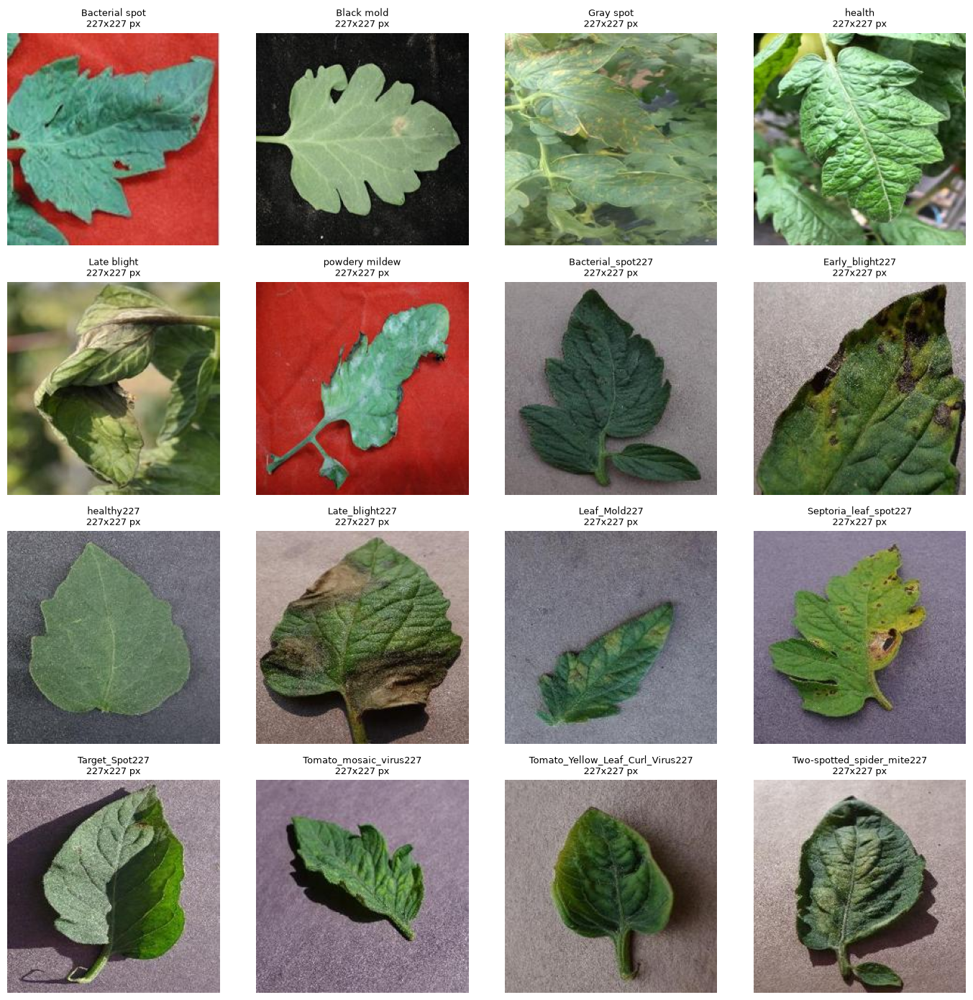

In [10]:
mostrar_grid_por_clase(df_meta)

In [11]:
# Ejecución del resumen
df_categorias = resumir_categorias_dataset('./data')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
display(df_categorias)

,No Preprocesada,Preprocesada,Train,Test,Sin Split,Total_Imagenes
Categoria,,,,,,
Bacterial spot,880,110,792,198,0,990
Bacterial_spot227,8510,1702,6808,1702,1702,10212
Black mold,536,67,481,122,0,603
Early_blight227,4000,800,3200,800,800,4800
Gray spot,672,84,604,152,0,756
Late blight,784,98,705,177,0,882
Late_blight227,7640,1528,6112,1528,1528,9168
Leaf_Mold227,3810,762,3048,762,762,4572
Septoria_leaf_spot227,7085,1417,5668,1417,1417,8502


Confirmamos la hipótesis anterior: Acorde a la documentación existen alrededor de 19 k fotos. Sin embargo, podemos notar que únicamente para `Tomato_Yellow_Leaf_Curl_Virus227`se leen más de 25 k. Leeremos únicamente las fotos de `plantvillage/Preprocessed data` y `taiwan/data augmentation`

<div style="border-left:4px solid #3D6FB0;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="background:#3D6FB0;color:#FFFFFF;border-radius:3px;padding:2px 9px;font-size:11px;letter-spacing:.6px;"> </span><br/><span style="color:#3D6FB0;font-size:21px;font-weight:700;">3. Transformación</span></div>

 ## Decisiones de transformación
 
1. **Aplanar imágenes posterior a escala de grises y en 64x64:** Se conservan todos los pixeles de imágenes después de pasarlas a escala de grises y a dimensiones de 64x64.
2. **Escalado StandardScaler (para PCA y t-SNE):** se estandarizan los datos (media 0, varianza 1) antes de aplicar PCA y t-SNE como buena práctica para ambos algoritmos. Una vez transformados los datos, evaluaremos de cualquier modo las distribuciones para confirmar su uso.
3. **Escalado MinMaxScaler (para NMF):** Sabemos que NMF requiere valores no negativos; como las imágenes se aplanan a partir de intensidades de píxel en escala de grises (siempre no negativas), esto se cumple de forma natural, sin embargo, se dividirá sobre 255 para obtener escala [0,1].
4. **Separación de train y test:** Dado que el dataset de Taiwan tiene imágenes generadas artificialmente y ya viene separado en Train y Test, se mantendrá esa distribución usando los metadatos ANTES de escalar. Por lo mismo, se separa Plantvillage antes de escalar.
5. **Resultados de dataframes:** Se obtendrán dos dataframes con los que trabajar, uno solo con características (resultado del punto 1) y otro con metadatos de esas imágenes para conservar las etiquetas. 

In [12]:
def extraer_metadatos_ruta(ruta_img, ruta_base):
    """ 
    Función que resume los metadatos por imagen (indica el split de entrenamiento/prueba
    y la categoría a la que pertenece).

    Args:
        ruta_img (str): Dirección completa de la imagen que permite deducir parte de los metadatos
        ruta_base (str): Dirección de la carpeta origen.

    Returns:
        dict: Metadatos semiestructurados.
    """
    partes_lower = [p.lower() for p in ruta_img.relative_to(ruta_base).parts]
    if 'train' in partes_lower:
        split = 'Train' # Identificamos si se encuentra en un folder de train o test
    elif 'test' in partes_lower:
        split = 'Test'
    else:
        split = 'Sin Split'

    categoria = ruta_img.parent.name

    return {
        'split': split,
        'categoria': categoria,
    }


In [13]:
def cargar_dataset_aplanado(base_dir, nombre_dataset, tam_img=(64, 64), extensiones=None, mostrar_progreso=True):
    """ 
    Función principal de carga de datos. Carga cada imagen presente en la carpeta, la convierte a
    escala de grises, la redimensiona a `tam_img` y la aplana a un vector, además de recopilar
    los metadatos de cada registro individual a través de la función anterior.

    Args:
        base_dir (str): Dirección de la carpeta que contiene toda la información
        nombre_dataset (str): Información del dataset de origen
        tam_img (tuple, (64, 64) predeterminado): Resolución deseada para el redimensionado.
        extensiones (dict, None predeterminado): Tipos de archivos a leer.
        mostrar_progreso (bool, True predeterminado): Para modificar si se muestra el progreso de carga o no
    
    Returns:
        X (np.ndarray): Array con todos los registros aplanados y listos para someter a transformación.
        df_meta (pd.DataFrame): DataFrame con los metadatos ('ruta', 'split', 'categoria') de cada registro.
    """
    if extensiones is None:
        extensiones = {'.jpg', '.jpeg', '.png', '.bmp'}

    ruta_base = Path(base_dir)
    rutas_img = [p for p in ruta_base.rglob('*') if p.suffix.lower() in extensiones]
    n = len(rutas_img)

    if n == 0:
        raise ValueError(f"No se encontraron imágenes en {base_dir}")

    iterador = rutas_img
    if mostrar_progreso:
        try:
            from tqdm import tqdm
            iterador = tqdm(rutas_img, desc=f'Procesando {nombre_dataset}')
        except ImportError:
            pass

    features = []
    registros = []
    for ruta_img in iterador:
        try:
            with Image.open(ruta_img) as img:
                img_gris = img.convert('L') # Escala de grises
                img_gris = img_gris.resize(tam_img, Image.Resampling.LANCZOS) # Redimensionado
                arr = np.asarray(img_gris, dtype=np.uint8)

            vector = arr.flatten() # Aplanado a vector
            features.append(vector)

            meta = extraer_metadatos_ruta(ruta_img, ruta_base)
            meta['ruta'] = str(ruta_img)
            registros.append(meta)
        except Exception as e:
            print(f"Imagen omitida por error ({ruta_img}): {e}")

    X = np.array(features, dtype=np.float64)
    df_meta = pd.DataFrame(registros)[['ruta', 'split', 'categoria']]

    return X, df_meta


In [14]:
X_plantvillage, meta_plantvillage = cargar_dataset_aplanado('./data/plantvillage/Preprocessed data', nombre_dataset='plantvillage')
X_taiwan, meta_taiwan = cargar_dataset_aplanado('./data/taiwan/data augmentation', nombre_dataset='taiwan')

print("PlantVillage: ", X_plantvillage.shape, "-> filas:", len(meta_plantvillage))
print("Taiwan: ", X_taiwan.shape, "-> filas:", len(meta_taiwan))

display(meta_plantvillage.head())
display(meta_taiwan.head())

Procesando taiwan: 100%|██████████| 4976/4976 [00:03<00:00, 1300.10it/s]


PlantVillage:  (14531, 4096) -> filas: 14531
Taiwan:  (4976, 4096) -> filas: 4976


,ruta,split,categoria
0,data\plantvillage\Preprocessed data\Bacterial_...,Sin Split,Bacterial_spot227
1,data\plantvillage\Preprocessed data\Bacterial_...,Sin Split,Bacterial_spot227
2,data\plantvillage\Preprocessed data\Bacterial_...,Sin Split,Bacterial_spot227
3,data\plantvillage\Preprocessed data\Bacterial_...,Sin Split,Bacterial_spot227
4,data\plantvillage\Preprocessed data\Bacterial_...,Sin Split,Bacterial_spot227


,ruta,split,categoria
0,data\taiwan\data augmentation\Train\Bacterial ...,Train,Bacterial spot
1,data\taiwan\data augmentation\Train\Bacterial ...,Train,Bacterial spot
2,data\taiwan\data augmentation\Train\Bacterial ...,Train,Bacterial spot
3,data\taiwan\data augmentation\Train\Bacterial ...,Train,Bacterial spot
4,data\taiwan\data augmentation\Train\Bacterial ...,Train,Bacterial spot


In [15]:
# Limpieza del texto de la columna 'categoria': quitamos el sufijo '227', cambiamos '_' por ' ' y recortamos espacios
for meta in (meta_plantvillage, meta_taiwan):
    meta['categoria'] = meta['categoria'].str.replace('227', '', regex=False).str.replace('_', ' ', regex=False).str.strip()

display(meta_plantvillage['categoria'].unique())
display(meta_taiwan['categoria'].unique())

<StringArray>
[               'Bacterial spot',                  'Early blight',
                       'healthy',                   'Late blight',
                     'Leaf Mold',            'Septoria leaf spot',
                   'Target Spot',           'Tomato mosaic virus',
 'Tomato Yellow Leaf Curl Virus',       'Two-spotted spider mite']
Length: 10, dtype: str

<StringArray>
['Bacterial spot',     'Black mold',      'Gray spot',         'health',
    'Late blight', 'powdery mildew']
Length: 6, dtype: str

In [16]:
def eliminar_duplicados(X, df_meta):
    """
    Elimina las filas duplicadas de la matriz de características X y sincroniza el
    DataFrame de metadatos asociado usando los índices de las filas conservadas, de
    forma que X y df_meta queden alineados uno a uno.

    Args:
        X (np.ndarray): Matriz de características, una fila por imagen.
        df_meta (pd.DataFrame): Metadatos de cada imagen, en el mismo orden que X.

    Returns:
        X_unico (np.ndarray): Matriz de características sin duplicados.
        df_meta_unico (pd.DataFrame): Metadatos sincronizados con X_unico.
    """
    mascara_unicos = ~pd.DataFrame(X).duplicated(keep='first').to_numpy()
    X_unico = X[mascara_unicos]
    df_meta_unico = df_meta.loc[mascara_unicos].reset_index(drop=True)
    return X_unico, df_meta_unico

n_plant_antes, n_taiwan_antes = len(meta_plantvillage), len(meta_taiwan)

X_plantvillage, meta_plantvillage = eliminar_duplicados(X_plantvillage, meta_plantvillage)
X_taiwan, meta_taiwan = eliminar_duplicados(X_taiwan, meta_taiwan)

print(f"PlantVillage: {n_plant_antes - len(meta_plantvillage)} duplicados eliminados -> {X_plantvillage.shape}")
print(f"Taiwan: {n_taiwan_antes - len(meta_taiwan)} duplicados eliminados -> {X_taiwan.shape}")

PlantVillage: 10 duplicados eliminados -> (14521, 4096)
Taiwan: 0 duplicados eliminados -> (4976, 4096)


In [17]:
# Persistir a disco para no repetir el procesamiento cada vez
np.save('X_plantvillage.npy', X_plantvillage)
np.save('X_taiwan.npy', X_taiwan)
meta_plantvillage.to_csv('meta_plantvillage.csv')
meta_taiwan.to_csv('meta_taiwan.csv')

In [18]:
X_plantvillage = np.load('X_plantvillage.npy')
X_taiwan = np.load('X_taiwan.npy')
meta_plantvillage = pd.read_csv('meta_plantvillage.csv')
meta_taiwan = pd.read_csv('meta_taiwan.csv')
df_plantvillage = pd.DataFrame(X_plantvillage)
df_taiwan = pd.DataFrame(X_taiwan)

	PLANTVILLAGE
Número de registros: 14521
Número de columnas: 4096
----------------------------------------------------------------------------------------------------
Valores nulos: 0
Valores duplicados: 0
----------------------------------------------------------------------------------------------------
Mostrando boxplots de una muestra aleatoria de 25 de 4096 columnas numéricas totales.


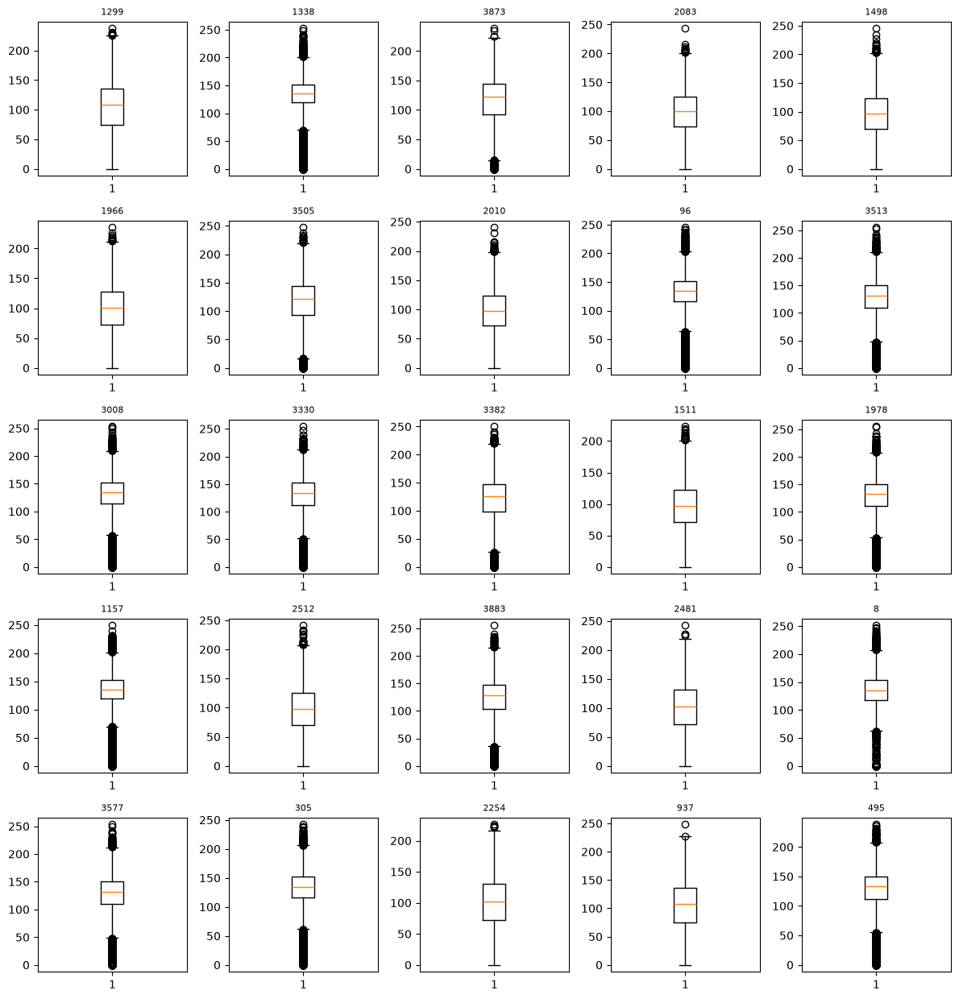

Estadísticas descriptivas:


,1299,1338,3873,2083,1498,1966,3505,2010,96,3513,3008,3330,3382,1511,1978,1157,2512,3883,2481,8,3577,305,2254,937,495
count,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000,14521.000000
mean,104.687143,132.936506,117.117760,99.360581,96.410784,99.657186,116.093107,97.640658,130.975277,127.298671,130.894222,129.980718,120.502376,97.243716,126.065560,133.620136,97.600303,123.103918,100.864748,135.030576,127.940431,131.911783,100.697335,105.109359,127.916121
std,41.254448,33.179493,39.819568,35.586220,36.913491,39.479174,40.059285,35.545171,35.132914,35.802944,33.658815,33.684074,39.492621,36.985877,38.638802,32.681741,39.105838,37.292892,40.878728,30.498587,35.279585,33.056603,40.679946,41.479598,35.793119
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,75.000000,119.000000,93.000000,74.000000,70.000000,72.000000,93.000000,73.000000,116.000000,109.000000,114.000000,112.000000,99.000000,71.000000,111.000000,119.000000,70.000000,103.000000,72.000000,117.000000,110.000000,116.000000,72.000000,75.000000,112.000000
50%,108.000000,136.000000,123.000000,100.000000,96.000000,101.000000,122.000000,98.000000,135.000000,131.000000,134.000000,133.000000,126.000000,97.000000,133.000000,136.000000,98.000000,128.000000,103.000000,135.000000,131.000000,135.000000,102.000000,108.000000,133.000000
75%,135.000000,152.000000,145.000000,125.000000,123.000000,128.000000,144.000000,123.000000,151.000000,150.000000,152.000000,152.000000,147.000000,123.000000,150.000000,152.000000,125.000000,148.000000,131.000000,153.000000,151.000000,152.000000,130.000000,136.000000,150.000000
max,237.000000,252.000000,238.000000,243.000000,245.000000,235.000000,247.000000,240.000000,245.000000,255.000000,253.000000,254.000000,250.000000,223.000000,255.000000,249.000000,241.000000,255.000000,242.000000,251.000000,253.000000,242.000000,226.000000,248.000000,238.000000


	TAIWAN
Número de registros: 4976
Número de columnas: 4096
----------------------------------------------------------------------------------------------------
Valores nulos: 0
Valores duplicados: 0
----------------------------------------------------------------------------------------------------
Mostrando boxplots de una muestra aleatoria de 25 de 4096 columnas numéricas totales.


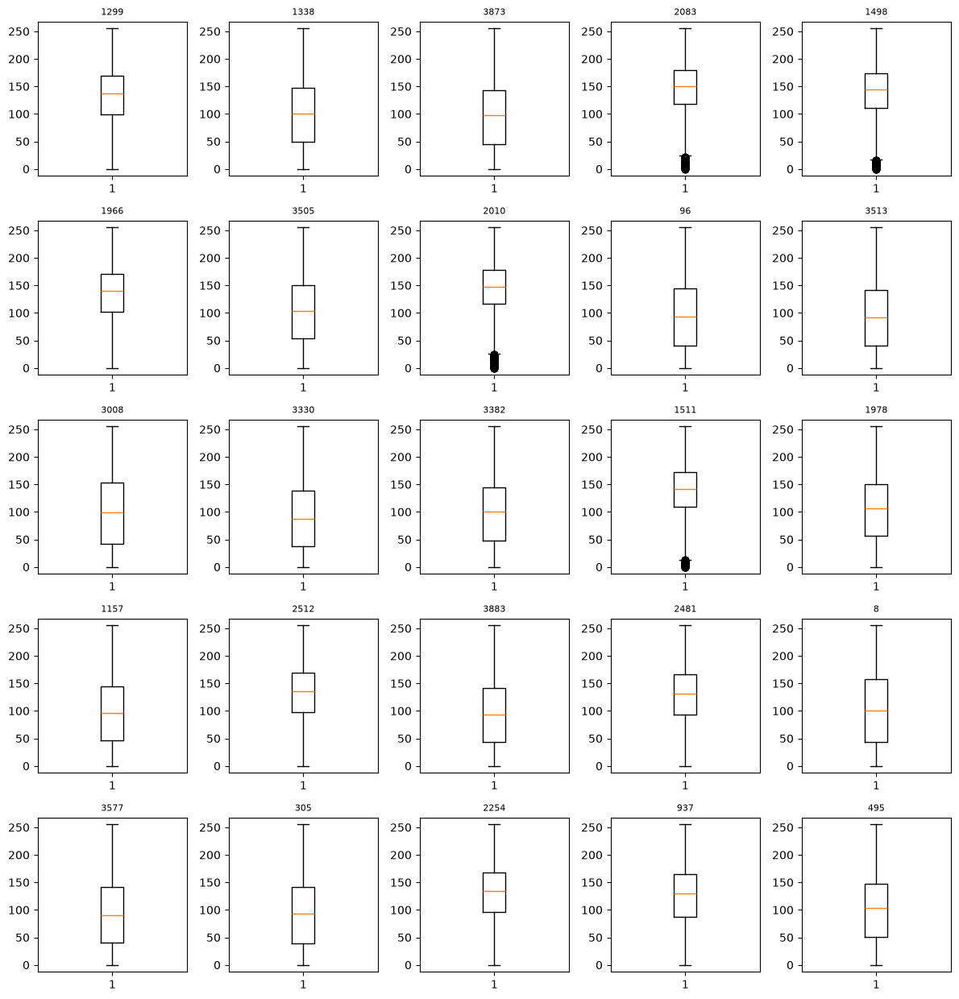

Estadísticas descriptivas:


,1299,1338,3873,2083,1498,1966,3505,2010,96,3513,3008,3330,3382,1511,1978,1157,2512,3883,2481,8,3577,305,2254,937,495
count,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000,4976.000000
mean,132.679662,101.248392,97.809887,147.768891,141.451166,134.997387,102.940514,145.604703,96.343449,95.389871,103.213424,93.274719,99.641881,139.659365,105.926045,99.002814,131.442725,96.296222,127.685892,104.918207,94.434686,95.458601,129.649920,124.893288,102.300241
std,54.332783,62.971192,62.178211,46.447572,48.915766,52.205753,61.625793,46.821216,64.503154,62.839807,69.780986,63.861948,62.100929,49.346054,62.726547,62.678537,53.924193,63.121724,55.529564,70.896501,63.168704,63.500655,54.402103,56.942620,62.736429
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,99.000000,49.000000,45.000000,118.000000,111.000000,102.000000,54.000000,117.000000,40.000000,41.000000,42.000000,37.000000,47.750000,109.000000,56.000000,47.000000,98.000000,43.000000,93.000000,43.000000,40.000000,39.750000,96.000000,88.000000,51.000000
50%,136.500000,101.000000,97.000000,150.000000,145.000000,140.000000,104.000000,147.000000,93.000000,92.000000,99.000000,88.000000,100.000000,142.000000,107.000000,96.000000,135.000000,93.000000,132.000000,100.000000,91.000000,93.000000,134.000000,130.000000,103.000000
75%,169.000000,147.000000,143.000000,180.000000,174.000000,171.000000,150.000000,178.000000,144.000000,142.000000,153.000000,138.000000,145.000000,173.000000,151.000000,145.000000,169.000000,141.000000,167.000000,157.000000,141.250000,141.000000,168.000000,165.000000,147.000000
max,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


In [19]:
def perfilado_general_muestra(df, n_muestra=30, random_state=42):
    """
    Genera un perfilado exploratorio de un DataFrame de alta dimensionalidad,
    mostrando boxplots de una muestra aleatoria de columnas numéricas.

    Args:
        df (pd.DataFrame): DataFrame a perfilar 
        n_muestra (int): número de columnas numéricas a graficar en los
            boxplots. Default 30.
        random_state (int): semilla para la selección aleatoria de columnas,
            para reproducibilidad.

    Returns:
        None: la función imprime y despliega los resultados directamente
        (no retorna ningún objeto).
    """
    n, m = df.shape
    print(f'Número de registros: {n}')
    print(f'Número de columnas: {m}')
    print('-' * 100)
    print(f'Valores nulos: {df.isna().sum().sum()}')
    print(f'Valores duplicados: {df.duplicated().sum()}')
    print('-' * 100)

    cols_numericas = df.select_dtypes(include=('float64', 'int64')).columns
    cols_muestra = pd.Series(cols_numericas).sample(
        n=min(n_muestra, len(cols_numericas)), random_state=random_state
    )

    print(f'Mostrando boxplots de una muestra aleatoria de {len(cols_muestra)} '
          f'de {len(cols_numericas)} columnas numéricas totales.')

    col_num = len(cols_muestra)
    plt.figure(figsize=(12, mt.ceil(col_num / 5) * 2.5))
    for i, column in enumerate(cols_muestra):
        plt.subplot(mt.ceil(col_num / 5), 5, i + 1)
        plt.boxplot(df[column])
        plt.title(column, fontsize=8)
    plt.tight_layout()
    plt.show()

    print('Estadísticas descriptivas:')
    display(df[cols_muestra].describe())

print('\tPLANTVILLAGE')
perfilado_general_muestra(df_plantvillage, n_muestra= 25)
print('\tTAIWAN')
perfilado_general_muestra(df_taiwan, n_muestra= 25)

**Observaciones:**

Los valores atípicos pueden deberse posiblemente a zonas muy oscuras o muy claras dentro de las imágenes como el fondo. Como se mencionó anteriormente, previo a implementar los algoritmos deseados se implementarán los correspondientes escalados, por ende, no es intrínsecamente necesario realizar una imputación.

In [20]:
# Separación train/test antes de escalar (el StandardScaler solo se ajusta con el train)

# Taiwan: usamos tal cual la columna 'split' ya existente en meta_taiwan (Train/Test)
mask_taiwan_train = (meta_taiwan['split'] == 'Train').to_numpy()
mask_taiwan_test = (meta_taiwan['split'] == 'Test').to_numpy()

X_taiwan_train = X_taiwan[mask_taiwan_train]
X_taiwan_test = X_taiwan[mask_taiwan_test]
meta_taiwan_train = meta_taiwan.loc[mask_taiwan_train].reset_index(drop=True)
meta_taiwan_test = meta_taiwan.loc[mask_taiwan_test].reset_index(drop=True)

# PlantVillage: split estratificado por categoría (80% train / 20% test), ya que el dataset no trae uno propio
idx_plant_train, idx_plant_test = train_test_split(
    meta_plantvillage.index,
    test_size=0.2,
    stratify=meta_plantvillage['categoria'],
    random_state=42,
)

# Reflejamos el resultado del split en la columna 'split' de meta_plantvillage, sin perder la alineación con X_plantvillage
meta_plantvillage.loc[idx_plant_train, 'split'] = 'Train'
meta_plantvillage.loc[idx_plant_test, 'split'] = 'Test'

X_plantvillage_train = X_plantvillage[idx_plant_train]
X_plantvillage_test = X_plantvillage[idx_plant_test]
meta_plantvillage_train = meta_plantvillage.loc[idx_plant_train].reset_index(drop=True)
meta_plantvillage_test = meta_plantvillage.loc[idx_plant_test].reset_index(drop=True)

print("PlantVillage -> train:", X_plantvillage_train.shape, "test:", X_plantvillage_test.shape)
print("Taiwan -> train:", X_taiwan_train.shape, "test:", X_taiwan_test.shape)

PlantVillage -> train: (11616, 4096) test: (2905, 4096)
Taiwan -> train: (3978, 4096) test: (998, 4096)


In [21]:
# Escalado de características para NMF: de intensidades [0, 255] a [0, 1]
X_plantvillage_mm = X_plantvillage / 255.0
X_taiwan_mm = X_taiwan / 255.0

# Escalado de características para PCA y t-SNE: estandarización a media 0 y desviación estándar 1
# El StandardScaler se ajusta (fit) únicamente con el train de cada base, y ese mismo ajuste se usa para transformar el test (evita fuga de información)

scaler_plantvillage = StandardScaler()
X_plantvillage_train_std = scaler_plantvillage.fit_transform(X_plantvillage_train)
X_plantvillage_test_std = scaler_plantvillage.transform(X_plantvillage_test)

scaler_taiwan = StandardScaler()
X_taiwan_train_std = scaler_taiwan.fit_transform(X_taiwan_train)
X_taiwan_test_std = scaler_taiwan.transform(X_taiwan_test)

## Resultados de transformación

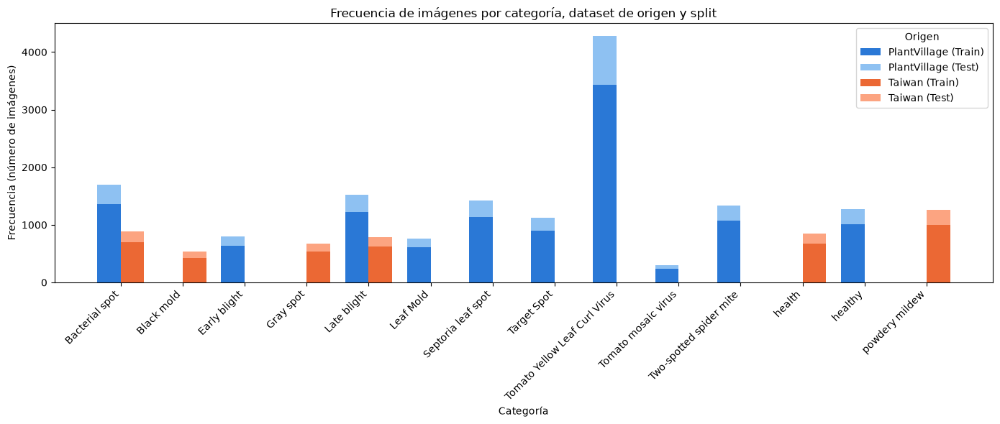

In [22]:
# Frecuencia de imágenes por categoría, dataset de origen (plantvillage/taiwan) y split (train/test)
categorias_todas = sorted(set(meta_plantvillage['categoria']) | set(meta_taiwan['categoria']))

conteo_plant_train = meta_plantvillage.loc[meta_plantvillage['split'] == 'Train', 'categoria'].value_counts().reindex(categorias_todas, fill_value=0)
conteo_plant_test = meta_plantvillage.loc[meta_plantvillage['split'] == 'Test', 'categoria'].value_counts().reindex(categorias_todas, fill_value=0)
conteo_taiwan_train = meta_taiwan.loc[meta_taiwan['split'] == 'Train', 'categoria'].value_counts().reindex(categorias_todas, fill_value=0)
conteo_taiwan_test = meta_taiwan.loc[meta_taiwan['split'] == 'Test', 'categoria'].value_counts().reindex(categorias_todas, fill_value=0)

x = np.arange(len(categorias_todas))
ancho = 0.38

plt.figure(figsize=(14, 6))
plt.bar(x - ancho / 2, conteo_plant_train.values, width=ancho, label='PlantVillage (Train)', color='#2a78d6')
plt.bar(x - ancho / 2, conteo_plant_test.values, width=ancho, bottom=conteo_plant_train.values, label='PlantVillage (Test)', color='#8ec1f2')
plt.bar(x + ancho / 2, conteo_taiwan_train.values, width=ancho, label='Taiwan (Train)', color='#eb6834')
plt.bar(x + ancho / 2, conteo_taiwan_test.values, width=ancho, bottom=conteo_taiwan_train.values, label='Taiwan (Test)', color="#fca481")

plt.xlabel('Categoría')
plt.ylabel('Frecuencia (número de imágenes)')
plt.title('Frecuencia de imágenes por categoría, dataset de origen y split')
plt.xticks(x, categorias_todas, rotation=45, ha='right')
plt.legend(title='Origen')
plt.tight_layout()
plt.show()

In [23]:
display(meta_plantvillage.sample(5))
display(meta_taiwan.sample(5))

,ruta,split,categoria
630,data\plantvillage\Preprocessed data\Bacterial_...,Train,Bacterial spot
6280,data\plantvillage\Preprocessed data\Septoria_l...,Test,Septoria leaf spot
1832,data\plantvillage\Preprocessed data\Early_blig...,Train,Early blight
10934,data\plantvillage\Preprocessed data\Tomato_Yel...,Test,Tomato Yellow Leaf Curl Virus
11504,data\plantvillage\Preprocessed data\Tomato_Yel...,Train,Tomato Yellow Leaf Curl Virus


,ruta,split,categoria
1123,data\taiwan\data augmentation\Train\Black mold...,Train,Black mold
3252,data\taiwan\data augmentation\Train\powdery mi...,Train,powdery mildew
4664,data\taiwan\data augmentation\Test\Late blight...,Test,Late blight
3138,data\taiwan\data augmentation\Train\powdery mi...,Train,powdery mildew
3586,data\taiwan\data augmentation\Train\powdery mi...,Train,powdery mildew


<div style="border-left:4px solid #3D6FB0;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="background:#3D6FB0;color:#FFFFFF;border-radius:3px;padding:2px 9px;font-size:11px;letter-spacing:.6px;"></span><br/><span style="color:#3D6FB0;font-size:21px;font-weight:700;">4. Aplicación de Algoritmos </span></div>

### PCA

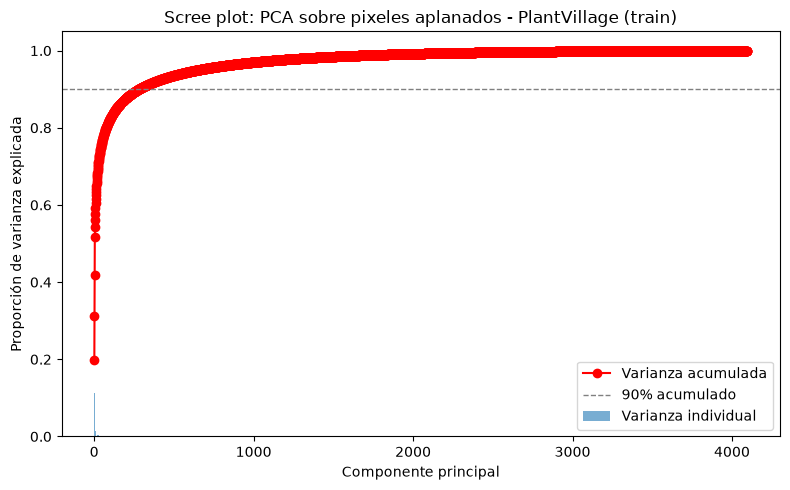

Primeros eigenvalores: [0.19846344 0.11255592 0.10706028 0.09959701 0.02437653]
Acumulada de los primeros eigenvalores: [0.19846344 0.31101936 0.41807964 0.51767665 0.54205318]


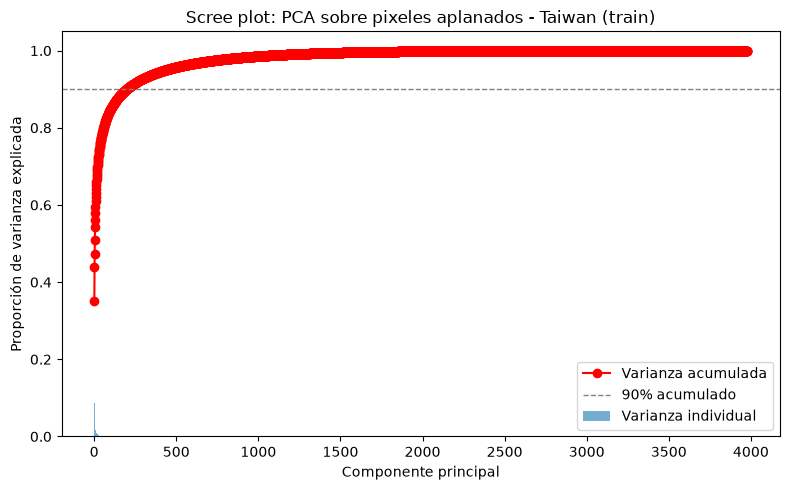

Primeros eigenvalores: [0.35210639 0.08631988 0.03571202 0.03486709 0.03375907]
Acumulada de los primeros eigenvalores: [0.35210639 0.43842627 0.47413828 0.50900538 0.54276445]


In [24]:
# Scree plot: varianza explicada y acumulada por PCA sobre los pixeles aplanados (train)
pca_plantvillage = PCA()
pca_plantvillage.fit(X_plantvillage_train_std)

varianza_explicada = pca_plantvillage.explained_variance_ratio_
varianza_acumulada = np.cumsum(varianza_explicada)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(varianza_explicada) + 1), varianza_explicada, alpha=0.6, label='Varianza individual')
plt.plot(range(1, len(varianza_acumulada) + 1), varianza_acumulada, marker='o', color='red', label='Varianza acumulada')
plt.axhline(0.9, color='gray', linestyle='--', linewidth=1, label='90% acumulado')
plt.xlabel('Componente principal')
plt.ylabel('Proporción de varianza explicada')
plt.title('Scree plot: PCA sobre pixeles aplanados - PlantVillage (train)')
plt.legend()
plt.tight_layout()
plt.show()

print(f'Primeros eigenvalores: {varianza_explicada[:5]}')
print(f'Acumulada de los primeros eigenvalores: {varianza_acumulada[:5]}')

pca_taiwan = PCA()
pca_taiwan.fit(X_taiwan_train_std)

varianza_explicada = pca_taiwan.explained_variance_ratio_
varianza_acumulada = np.cumsum(varianza_explicada)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(varianza_explicada) + 1), varianza_explicada, alpha=0.6, label='Varianza individual')
plt.plot(range(1, len(varianza_acumulada) + 1), varianza_acumulada, marker='o', color='red', label='Varianza acumulada')
plt.axhline(0.9, color='gray', linestyle='--', linewidth=1, label='90% acumulado')
plt.xlabel('Componente principal')
plt.ylabel('Proporción de varianza explicada')
plt.title('Scree plot: PCA sobre pixeles aplanados - Taiwan (train)')
plt.legend()
plt.tight_layout()
plt.show()

print(f'Primeros eigenvalores: {varianza_explicada[:5]}')
print(f'Acumulada de los primeros eigenvalores: {varianza_acumulada[:5]}')

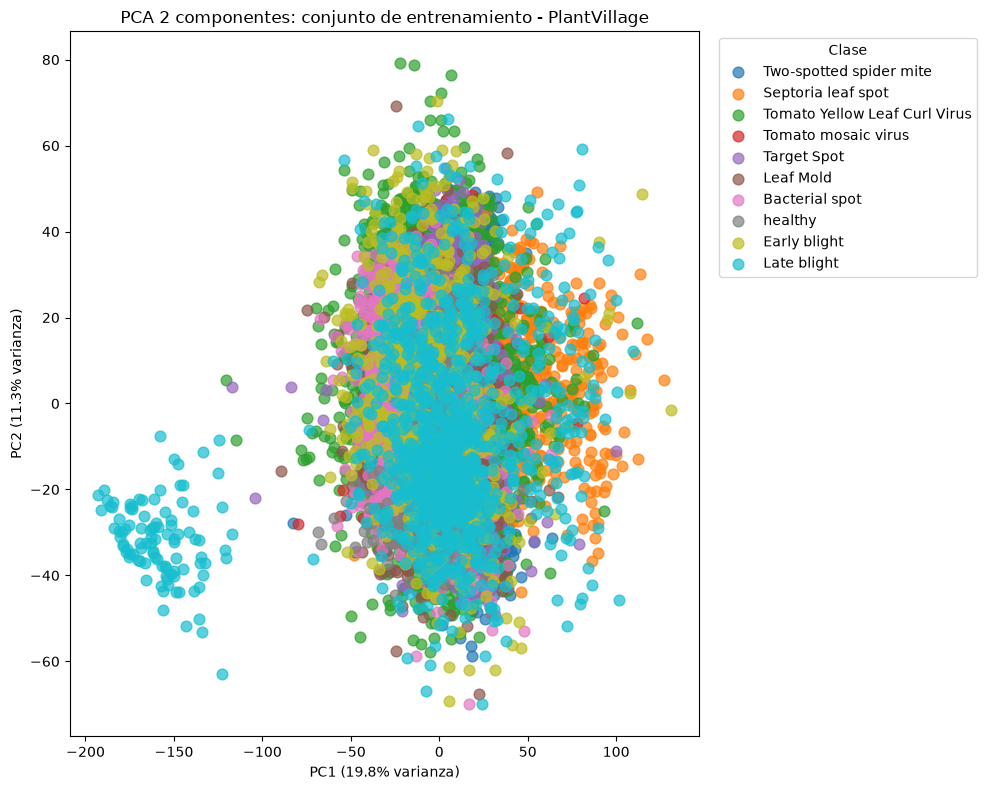

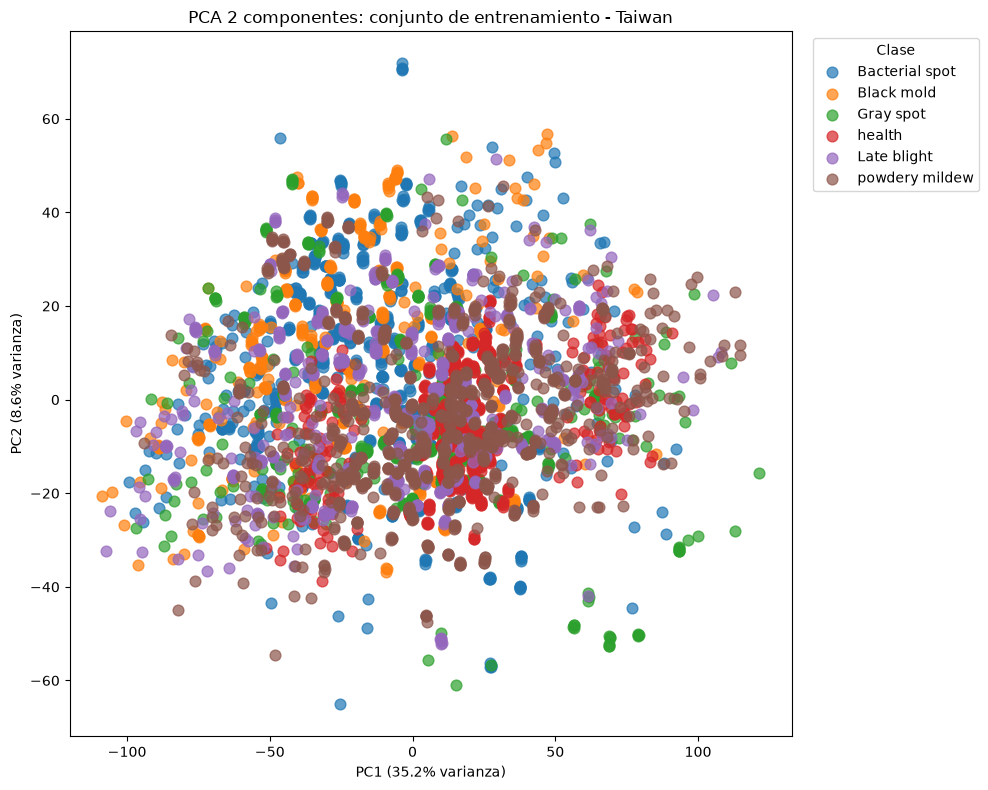

In [25]:
# PCA con 2 componentes, visualización a detalle (train)
pca_plantvillage_2 = PCA(n_components=2)
X_pca_plantvillage_2 = pca_plantvillage_2.fit_transform(X_plantvillage_train_std)
df_pca_plantvillage_2 = pd.DataFrame(X_pca_plantvillage_2, columns=['PC1', 'PC2'])
df_pca_plantvillage_2['categoria'] = meta_plantvillage_train['categoria'].values

plt.figure(figsize=(10, 8))
for clase in df_pca_plantvillage_2['categoria'].unique():
    subset = df_pca_plantvillage_2[df_pca_plantvillage_2['categoria'] == clase]
    plt.scatter(subset['PC1'], subset['PC2'], label=clase, alpha=0.7, s=60)

plt.xlabel(f'PC1 ({pca_plantvillage_2.explained_variance_ratio_[0]*100:.1f}% varianza)')
plt.ylabel(f'PC2 ({pca_plantvillage_2.explained_variance_ratio_[1]*100:.1f}% varianza)')
plt.title('PCA 2 componentes: conjunto de entrenamiento - PlantVillage')
plt.legend(title='Clase', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

pca_taiwan_2 = PCA(n_components=2)
X_pca_taiwan_2 = pca_taiwan_2.fit_transform(X_taiwan_train_std)
df_pca_taiwan_2 = pd.DataFrame(X_pca_taiwan_2, columns=['PC1', 'PC2'])
df_pca_taiwan_2['categoria'] = meta_taiwan_train['categoria'].values

plt.figure(figsize=(10, 8))
for clase in df_pca_taiwan_2['categoria'].unique():
    subset = df_pca_taiwan_2[df_pca_taiwan_2['categoria'] == clase]
    plt.scatter(subset['PC1'], subset['PC2'], label=clase, alpha=0.7, s=60)

plt.xlabel(f'PC1 ({pca_taiwan_2.explained_variance_ratio_[0]*100:.1f}% varianza)')
plt.ylabel(f'PC2 ({pca_taiwan_2.explained_variance_ratio_[1]*100:.1f}% varianza)')
plt.title('PCA 2 componentes: conjunto de entrenamiento - Taiwan')
plt.legend(title='Clase', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [26]:
# PCA con 3 componentes, visualización a detalle (train)
pca_plantvillage_3 = PCA(n_components=3)
X_pca_plantvillage_3 = pca_plantvillage_3.fit_transform(X_plantvillage_train_std)
df_pca_plantvillage_3 = pd.DataFrame(X_pca_plantvillage_3, columns=['PC1', 'PC2', 'PC3'])
df_pca_plantvillage_3['categoria'] = meta_plantvillage_train['categoria'].values

fig = px.scatter_3d(
    df_pca_plantvillage_3, x='PC1', y='PC2', z='PC3', color='categoria',
    title='PCA 3 componentes: conjunto de entrenamiento - PlantVillage'
)
fig.show()

pca_taiwan_3 = PCA(n_components=3)
X_pca_taiwan_3 = pca_taiwan_3.fit_transform(X_taiwan_train_std)
df_pca_taiwan_3 = pd.DataFrame(X_pca_taiwan_3, columns=['PC1', 'PC2', 'PC3'])
df_pca_taiwan_3['categoria'] = meta_taiwan_train['categoria'].values

fig = px.scatter_3d(
    df_pca_taiwan_3, x='PC1', y='PC2', z='PC3', color='categoria',
    title='PCA 3 componentes: conjunto de entrenamiento - Taiwan'
)
fig.show()

In [27]:
# PCA con componentes suficientes para explicar el 90% de la varianza, para uso posterior (t-SNE, clasificadores)
pca_plantvillage_90 = PCA(n_components=0.9)
X_pca_plantvillage_train = pca_plantvillage_90.fit_transform(X_plantvillage_train_std)
X_pca_plantvillage_test = pca_plantvillage_90.transform(X_plantvillage_test_std)
print(f'Se retuvieron {X_pca_plantvillage_train.shape[1]} componentes para PlantVillage')

pca_taiwan_90 = PCA(n_components=0.9)
X_pca_taiwan_train = pca_taiwan_90.fit_transform(X_taiwan_train_std)
X_pca_taiwan_test = pca_taiwan_90.transform(X_taiwan_test_std)
print(f'Se retuvieron {X_pca_taiwan_train.shape[1]} componentes para Taiwan')

Se retuvieron 281 componentes para PlantVillage
Se retuvieron 198 componentes para Taiwan


**PCA. Observaciones**

1. *Matriz de correlación:*

Directamente no se tiene visualización, dado que se trata de una gran cantidad de características. Sin embargo, puede haber alta correlación positiva en las regiones dentro de la hoja y del fondo, con correlaciones negativas en los bordes de las hojas.

2. *Scree Plot*

PC1 explica el 35.21% de la varianza total, PC2 añade un 8.63% adicional y PC3 aporta 3.57% más. Se retuvieron 281 componentes para `Plantvillage` y 198 componentes para `Taiwan`.

3. *Visualizaciones 2D y 3D:*

Para ninguno de los dos datasets se tienen visualizaciones que permitan diferenciar clases, cuando menos para las dimensiones que es posible visualizar.

### t-SNE

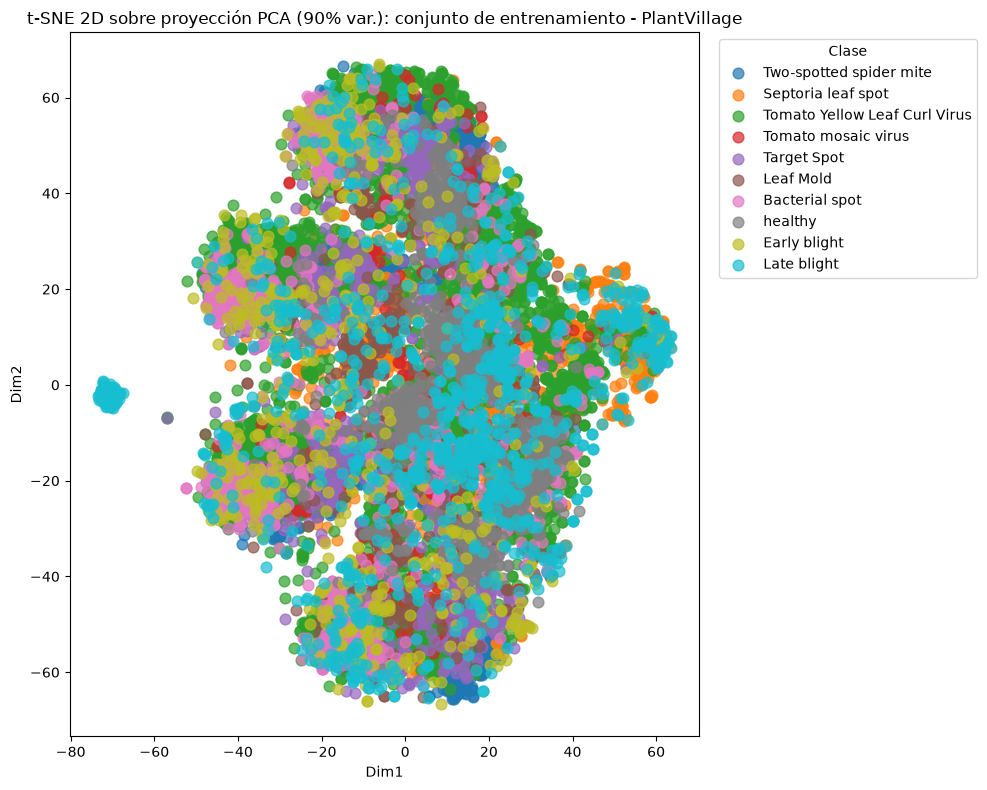

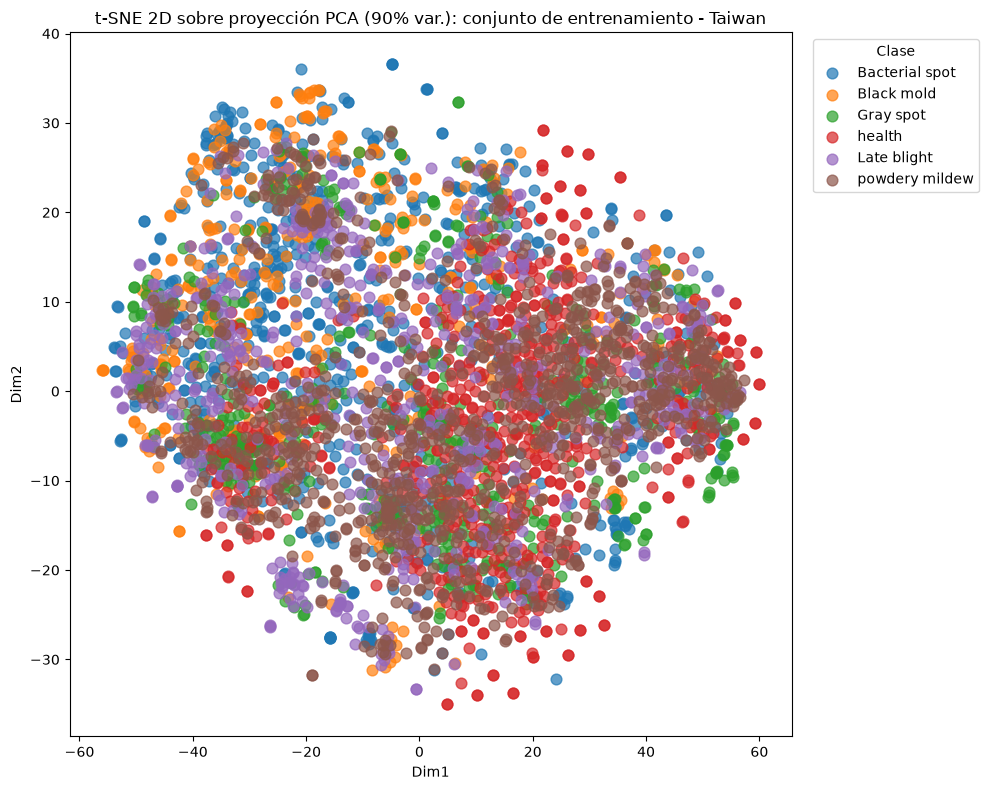

In [28]:
# t-SNE 2D sobre la proyección PCA (90% varianza) del train, coloreado por categoría
tsne_plantvillage_2 = TSNE(n_components=2, random_state=42, init='pca', n_jobs=-1)
X_tsne_plantvillage_2 = tsne_plantvillage_2.fit_transform(X_pca_plantvillage_train)
df_tsne_plantvillage_2 = pd.DataFrame(X_tsne_plantvillage_2, columns=['Dim1', 'Dim2'])
df_tsne_plantvillage_2['categoria'] = meta_plantvillage_train['categoria'].values

plt.figure(figsize=(10, 8))
for clase in df_tsne_plantvillage_2['categoria'].unique():
    subset = df_tsne_plantvillage_2[df_tsne_plantvillage_2['categoria'] == clase]
    plt.scatter(subset['Dim1'], subset['Dim2'], label=clase, alpha=0.7, s=60)
plt.xlabel('Dim1')
plt.ylabel('Dim2')
plt.title('t-SNE 2D sobre proyección PCA (90% var.): conjunto de entrenamiento - PlantVillage')
plt.legend(title='Clase', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

tsne_taiwan_2 = TSNE(n_components=2, random_state=42, init='pca', n_jobs=-1)
X_tsne_taiwan_2 = tsne_taiwan_2.fit_transform(X_pca_taiwan_train)
df_tsne_taiwan_2 = pd.DataFrame(X_tsne_taiwan_2, columns=['Dim1', 'Dim2'])
df_tsne_taiwan_2['categoria'] = meta_taiwan_train['categoria'].values

plt.figure(figsize=(10, 8))
for clase in df_tsne_taiwan_2['categoria'].unique():
    subset = df_tsne_taiwan_2[df_tsne_taiwan_2['categoria'] == clase]
    plt.scatter(subset['Dim1'], subset['Dim2'], label=clase, alpha=0.7, s=60)
plt.xlabel('Dim1')
plt.ylabel('Dim2')
plt.title('t-SNE 2D sobre proyección PCA (90% var.): conjunto de entrenamiento - Taiwan')
plt.legend(title='Clase', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [29]:
# t-SNE 3D sobre la proyección PCA (90% varianza) del train, coloreado por categoría
tsne_plantvillage_3 = TSNE(n_components=3, random_state=42, init='pca', n_jobs=-1)
X_tsne_plantvillage_3 = tsne_plantvillage_3.fit_transform(X_pca_plantvillage_train)
df_tsne_plantvillage_3 = pd.DataFrame(X_tsne_plantvillage_3, columns=['Dim1', 'Dim2', 'Dim3'])
df_tsne_plantvillage_3['categoria'] = meta_plantvillage_train['categoria'].values

fig = px.scatter_3d(
    df_tsne_plantvillage_3, x='Dim1', y='Dim2', z='Dim3', color='categoria',
    opacity=0.4,
    title='t-SNE 3D sobre proyección PCA (90% var.): conjunto de entrenamiento - PlantVillage'
)
fig.show()

tsne_taiwan_3 = TSNE(n_components=3, random_state=42, init='pca', n_jobs=-1)
X_tsne_taiwan_3 = tsne_taiwan_3.fit_transform(X_pca_taiwan_train)
df_tsne_taiwan_3 = pd.DataFrame(X_tsne_taiwan_3, columns=['Dim1', 'Dim2', 'Dim3'])
df_tsne_taiwan_3['categoria'] = meta_taiwan_train['categoria'].values

fig = px.scatter_3d(
    df_tsne_taiwan_3, x='Dim1', y='Dim2', z='Dim3', color='categoria',
    opacity=0.4,
    title='t-SNE 3D sobre proyección PCA (90% var.): conjunto de entrenamiento - Taiwan'
)
fig.show()

Realizaremos un barrido de Perplexity para determinar la máxima separabilidad para t-SNE.

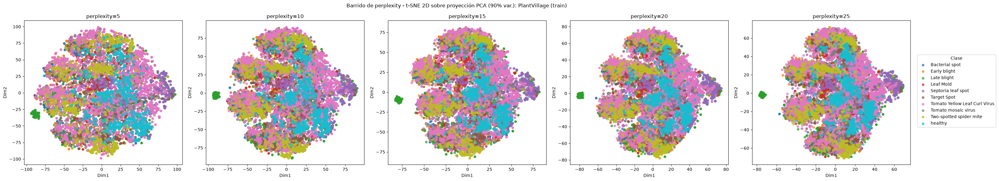

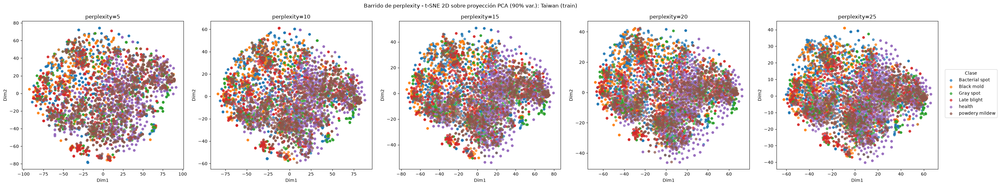

In [30]:
# Barrido de perplexity para t-SNE 2D, sobre la misma proyección PCA (90% varianza) usada como input.
# No reemplaza el t-SNE ya calculado; es una exploración adicional para revisar la sensibilidad a este parámetro.
perplexities_sweep = [5, 10, 15, 20, 25]


def grid_tsne_perplexity(X_pca_train, meta_train, perplexities, nombre_dataset):
    """
    Ajusta t-SNE 2D con distintos valores de perplexity sobre la misma proyección PCA de
    entrada, y muestra los resultados lado a lado en una cuadrícula de subplots, coloreados
    por categoría.

    Args:
        X_pca_train (np.ndarray): Proyección PCA (90% varianza) del conjunto de entrenamiento.
        meta_train (pd.DataFrame): Metadatos alineados con X_pca_train (columna 'categoria').
        perplexities (list[int]): Valores de perplexity a probar.
        nombre_dataset (str): Nombre del dataset, para los títulos.

    Returns:
        None: Muestra la cuadrícula de subplots, no retorna valores.
    """
    categorias = sorted(meta_train['categoria'].unique())
    paleta = dict(zip(categorias, plt.cm.tab10.colors[:len(categorias)]))

    fig, axes = plt.subplots(1, len(perplexities), figsize=(6 * len(perplexities), 6))
    for ax, perp in zip(axes, perplexities):
        tsne_p = TSNE(n_components=2, perplexity=perp, random_state=42, init='pca', n_jobs=-1)
        X_tsne_p = tsne_p.fit_transform(X_pca_train)
        df_p = pd.DataFrame(X_tsne_p, columns=['Dim1', 'Dim2'])
        df_p['categoria'] = meta_train['categoria'].values
        for clase in categorias:
            subset = df_p[df_p['categoria'] == clase]
            ax.scatter(subset['Dim1'], subset['Dim2'], label=clase, color=paleta[clase], alpha=0.7, s=25)
        ax.set_title(f'perplexity={perp}')
        ax.set_xlabel('Dim1')
        ax.set_ylabel('Dim2')

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, title='Clase', bbox_to_anchor=(1.0, 0.5), loc='center left')
    fig.suptitle(f'Barrido de perplexity - t-SNE 2D sobre proyección PCA (90% var.): {nombre_dataset} (train)')
    plt.tight_layout()
    plt.show()


grid_tsne_perplexity(X_pca_plantvillage_train, meta_plantvillage_train, perplexities_sweep, 'PlantVillage')
grid_tsne_perplexity(X_pca_taiwan_train, meta_taiwan_train, perplexities_sweep, 'Taiwan')

**t-SNE. Observaciones**

1. *Selección de Perplexity:*

Valores pequeños generan grupos con mayor varianza intraclase (grupos más *"extensos"*). Nos es más conveniente tener grupos compactos que faciliten diferenciarlos (De alguna forma, dado que no existe una clara diferenciación). Por ende, es más conveniente un valor mayor, tomando para ambos dataset 25.

2. *Visualizaciones 2D y 3D:*

`plantvillage` toma una forma curiosa, similar a la de una flor. Sin embargo, no existe separación clara perceptible. Para `taiwan`, por el contrario, no se tiene un resultado extraordinario: Las clases siguen siendo difusas, cuando menos en las tres dimensiones que es posible observar.

### NMF

Buscando k óptimo NMF (PlantVillage):   0%|          | 0/19 [00:00<?, ?it/s]c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
Buscando k óptimo NMF (PlantVillage):   5%|▌         | 1/19 [00:14<04:29, 14.95s/it]c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
Buscando k óptimo NMF (PlantVillage):  11%|█         | 2/19 [00:30<04:20, 15.32s/it]c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
Buscando k óptimo NMF (PlantVillage):  16%|█▌        | 3/19 [00:45<04:02

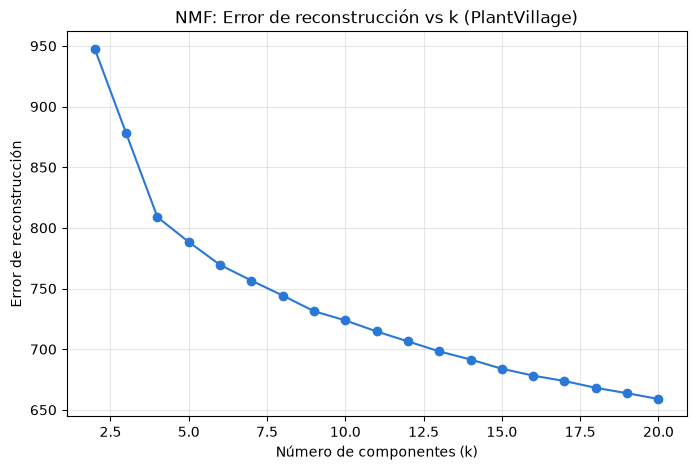

Buscando k óptimo NMF (Taiwan):   0%|          | 0/19 [00:00<?, ?it/s]c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
Buscando k óptimo NMF (Taiwan):   5%|▌         | 1/19 [00:03<01:07,  3.77s/it]c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
Buscando k óptimo NMF (Taiwan):  11%|█         | 2/19 [00:07<01:04,  3.79s/it]c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
Buscando k óptimo NMF (Taiwan):  16%|█▌        | 3/19 [00:11<01:00,  3.79s/it]c:\Users\PC\

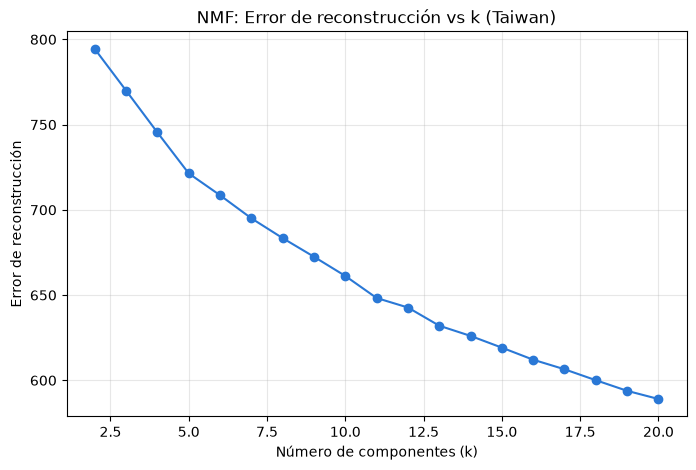

In [31]:
def buscar_k_optimo_nmf(X_scaled, k_list, nombre_dataset):
    """
    Prueba distintos valores de n_components para NMF sobre X_scaled y registra el
    error de reconstrucción de cada uno, graficando la curva k vs error (codo) para
    apoyar la selección de un buen valor de k.

    Args:
        X_scaled (np.ndarray): Matriz de características ya escalada a [0, 1].
        k_list (list[int]): Valores de n_components a evaluar.
        nombre_dataset (str): Nombre del dataset, para el título de la gráfica.

    Returns:
        errores (list[float]): Error de reconstrucción (reconstruction_err_) por cada k de k_list.
    """
    errores = []
    for k in tqdm(k_list, desc=f'Buscando k óptimo NMF ({nombre_dataset})'):
        nmf = NMF(n_components=k, random_state=42)
        nmf.fit(X_scaled)
        errores.append(nmf.reconstruction_err_)

    plt.figure(figsize=(8, 5))
    plt.plot(k_list, errores, marker='o', color='#2a78d6')
    plt.xlabel('Número de componentes (k)')
    plt.ylabel('Error de reconstrucción')
    plt.title(f'NMF: Error de reconstrucción vs k ({nombre_dataset})')
    plt.grid(alpha=0.3)
    plt.show()

    return errores

k_list = list(range(2, 21))  # Evaluar k desde 2 hasta 20

errores_plantvillage = buscar_k_optimo_nmf(X_plantvillage_mm, k_list, 'PlantVillage')
errores_taiwan = buscar_k_optimo_nmf(X_taiwan_mm, k_list, 'Taiwan')

In [32]:
k_optimo_plantvillage = 13
k_optimo_taiwan = 13

nmf_plantvillage = NMF(n_components=k_optimo_plantvillage, random_state=42, max_iter=500)
W_plantvillage = nmf_plantvillage.fit_transform(X_plantvillage_mm)
H_plantvillage = nmf_plantvillage.components_

nmf_taiwan = NMF(n_components=k_optimo_taiwan, random_state=42, max_iter=500)
W_taiwan = nmf_taiwan.fit_transform(X_taiwan_mm)
H_taiwan = nmf_taiwan.components_

print(f"PlantVillage: W {W_plantvillage.shape}, H {H_plantvillage.shape}")
print(f"Taiwan: W {W_taiwan.shape}, H {H_taiwan.shape}")

c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 500 reached. Increase it to improve convergence.
  warnings.warn(


PlantVillage: W (14521, 13), H (13, 4096)
Taiwan: W (4976, 13), H (13, 4096)


c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 500 reached. Increase it to improve convergence.
  warnings.warn(


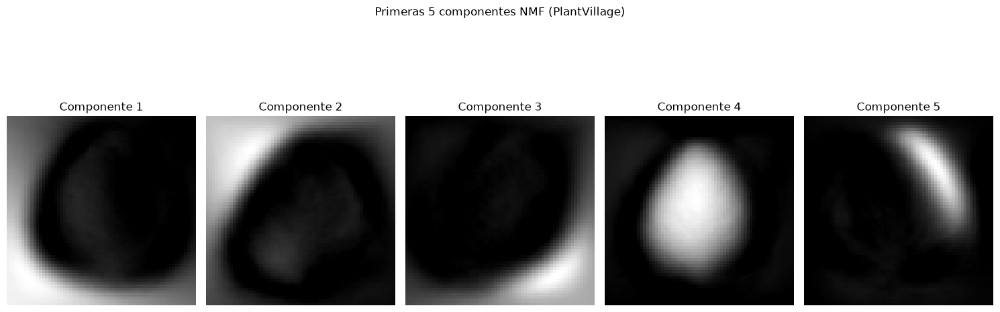

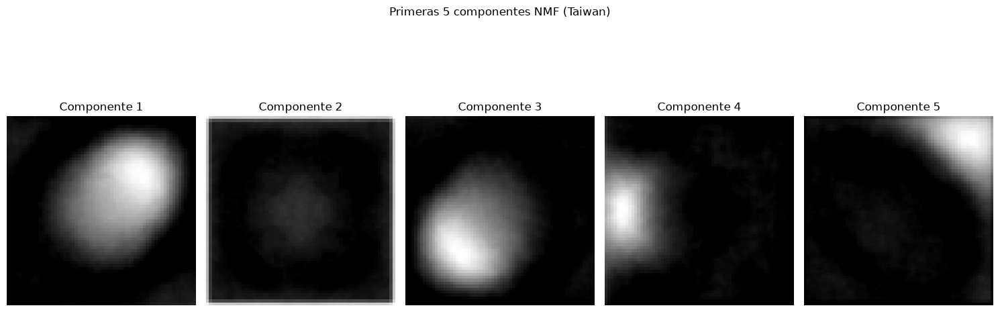

In [33]:
def graficar_componentes_nmf(H, nombre_dataset, n_componentes=10, img_shape=(64, 64)):
    """
    Grafica las primeras `n_componentes` filas de la matriz H aprendida por NMF,
    reinterpretándolas como imágenes en escala de grises de tamaño `img_shape`.

    Args:
        H (np.ndarray): Matriz de componentes de NMF (n_components x n_features).
        nombre_dataset (str): Nombre del dataset, para el título de la figura.
        n_componentes (int, 10 predeterminado): Número de componentes a graficar.
        img_shape (tuple, (64, 64) predeterminado): Forma para reinterpretar cada componente como imagen.

    Returns:
        None: Muestra la cuadrícula de componentes, no retorna valores.
    """
    fig, axes = plt.subplots(1, 5, figsize=(15, 6))
    axes = axes.flatten()
    for i in range(n_componentes):
        axes[i].imshow(H[i].reshape(img_shape), cmap='gray')
        axes[i].set_title(f'Componente {i + 1}')
        axes[i].axis('off')
    fig.suptitle(f'Primeras {n_componentes} componentes NMF ({nombre_dataset})')
    plt.tight_layout()
    plt.show()

graficar_componentes_nmf(H_plantvillage, 'PlantVillage', 5)
graficar_componentes_nmf(H_taiwan, 'Taiwan', 5)

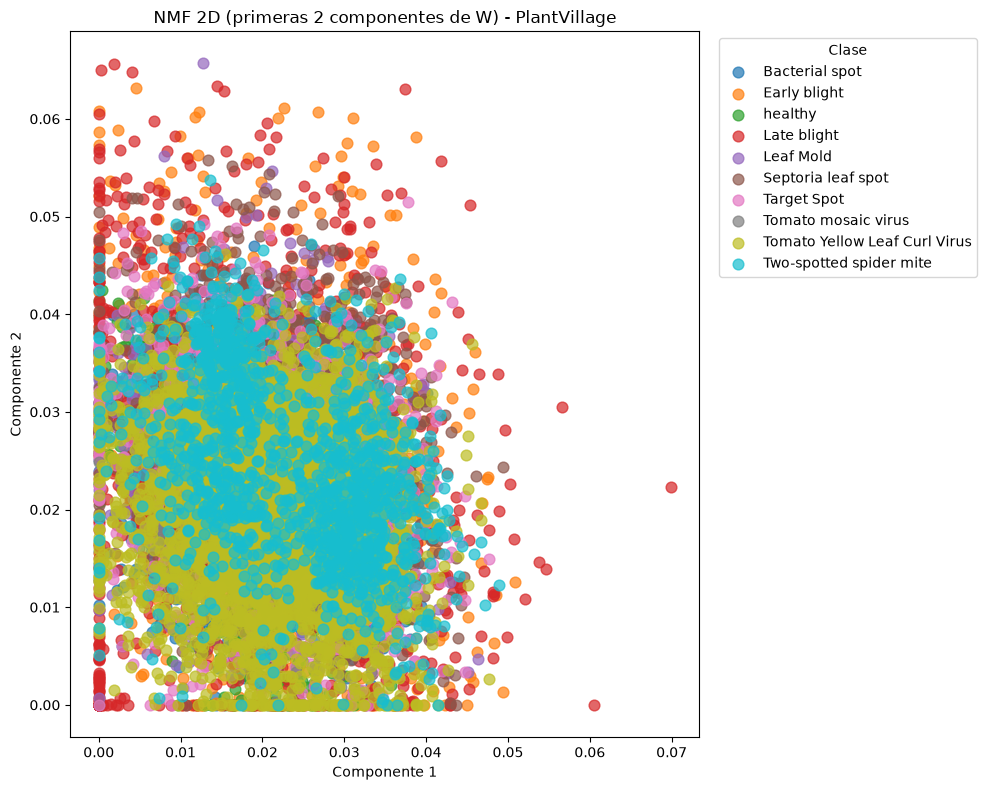

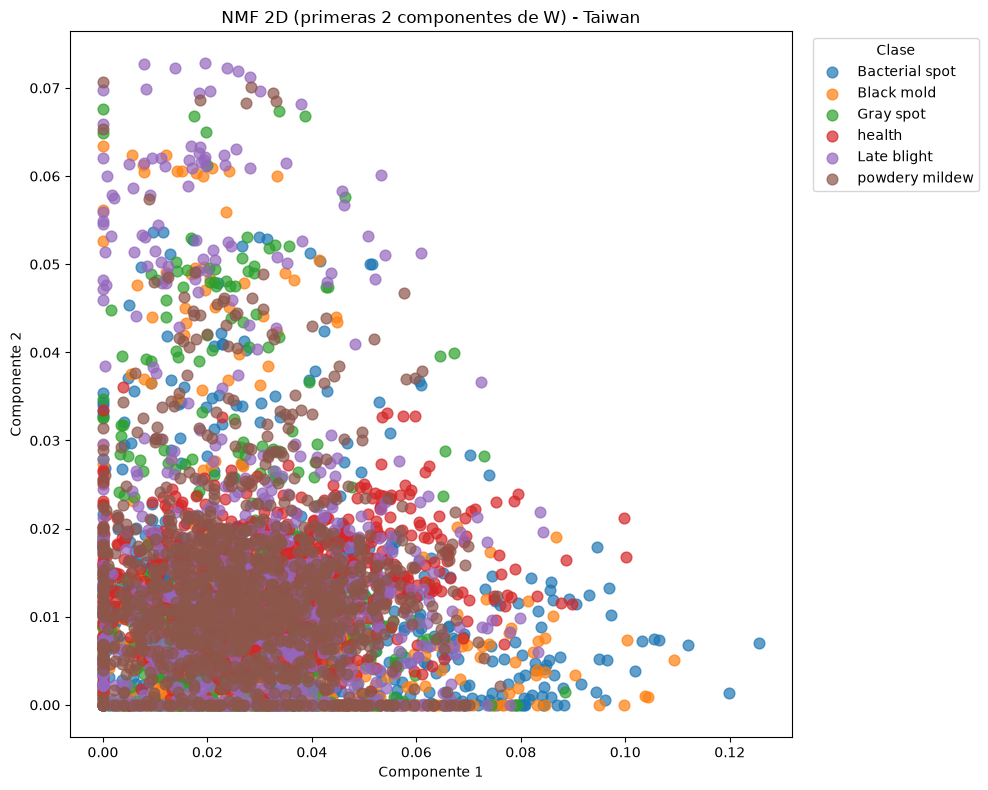

In [34]:
# Visualización 2D de las componentes NMF (W), coloreada por categoría
df_nmf_plantvillage_2 = pd.DataFrame(W_plantvillage[:, :2], columns=['Comp1', 'Comp2'])
df_nmf_plantvillage_2['categoria'] = meta_plantvillage['categoria'].values

plt.figure(figsize=(10, 8))
for clase in df_nmf_plantvillage_2['categoria'].unique():
    subset = df_nmf_plantvillage_2[df_nmf_plantvillage_2['categoria'] == clase]
    plt.scatter(subset['Comp1'], subset['Comp2'], label=clase, alpha=0.7, s=60)
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.title('NMF 2D (primeras 2 componentes de W) - PlantVillage')
plt.legend(title='Clase', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

df_nmf_taiwan_2 = pd.DataFrame(W_taiwan[:, :2], columns=['Comp1', 'Comp2'])
df_nmf_taiwan_2['categoria'] = meta_taiwan['categoria'].values

plt.figure(figsize=(10, 8))
for clase in df_nmf_taiwan_2['categoria'].unique():
    subset = df_nmf_taiwan_2[df_nmf_taiwan_2['categoria'] == clase]
    plt.scatter(subset['Comp1'], subset['Comp2'], label=clase, alpha=0.7, s=60)
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.title('NMF 2D (primeras 2 componentes de W) - Taiwan')
plt.legend(title='Clase', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [35]:
# Visualización 3D de las componentes NMF (W), coloreada por categoría
df_nmf_plantvillage_3 = pd.DataFrame(W_plantvillage[:, :3], columns=['Comp1', 'Comp2', 'Comp3'])
df_nmf_plantvillage_3['categoria'] = meta_plantvillage['categoria'].values

fig = px.scatter_3d(
    df_nmf_plantvillage_3, x='Comp1', y='Comp2', z='Comp3', color='categoria',
    opacity=0.4,
    title='NMF 3D (primeras 3 componentes de W) - PlantVillage'
)
fig.show()


df_nmf_taiwan_3 = pd.DataFrame(W_taiwan[:, :3], columns=['Comp1', 'Comp2', 'Comp3'])
df_nmf_taiwan_3['categoria'] = meta_taiwan['categoria'].values

fig = px.scatter_3d(
    df_nmf_taiwan_3, x='Comp1', y='Comp2', z='Comp3', color='categoria',
    opacity=0.4,
    title='NMF 3D (primeras 3 componentes de W) - Taiwan'
)
fig.show()

### Comparación 3D: PCA vs. NMF vs. t-SNE

In [36]:
# Comparación lado a lado de las 3 visualizaciones 3D ya calculadas (PCA, NMF, t-SNE),
# coloreadas por categoría, una figura por dataset.
import plotly.graph_objects as go
from plotly.subplots import make_subplots


def comparar_3d(df_pca, df_nmf, df_tsne, nombre_dataset):
    """
    Arma una figura con 3 paneles 3D lado a lado (PCA | NMF | t-SNE) a partir de las
    proyecciones ya calculadas en las secciones anteriores, coloreadas por categoría.

    Args:
        df_pca, df_nmf, df_tsne (pd.DataFrame): Cada uno con sus 3 columnas de coordenadas
            y una columna 'categoria', ya construidos en las secciones de PCA, NMF y t-SNE.
        nombre_dataset (str): Nombre del dataset, para el título de la figura.

    Returns:
        None: Muestra la figura, no retorna valores.
    """
    categorias = sorted(set(df_pca['categoria']) | set(df_nmf['categoria']) | set(df_tsne['categoria']))
    paleta_colores = (px.colors.qualitative.Plotly * 2)[:len(categorias)]
    paleta = dict(zip(categorias, paleta_colores))

    fig = make_subplots(
        rows=1, cols=3,
        specs=[[{'type': 'scene'}, {'type': 'scene'}, {'type': 'scene'}]],
        subplot_titles=('PCA', 'NMF', 't-SNE'),
    )

    paneles = [(df_pca, 1), (df_nmf, 2), (df_tsne, 3)]
    for df, col in paneles:
        ejes = [c for c in df.columns if c != 'categoria']
        for clase in categorias:
            subset = df[df['categoria'] == clase]
            if subset.empty:
                continue
            fig.add_trace(
                go.Scatter3d(
                    x=subset[ejes[0]], y=subset[ejes[1]], z=subset[ejes[2]],
                    mode='markers',
                    marker=dict(size=3, color=paleta[clase], opacity=0.5),
                    name=clase,
                    legendgroup=clase,
                    showlegend=(col == 1),
                ),
                row=1, col=col,
            )

    fig.update_layout(
        title=f'Comparación 3D: PCA | NMF | t-SNE - {nombre_dataset}',
        height=550, width=1500,
    )
    fig.show()


comparar_3d(df_pca_plantvillage_3, df_nmf_plantvillage_3, df_tsne_plantvillage_3, 'PlantVillage')
comparar_3d(df_pca_taiwan_3, df_nmf_taiwan_3, df_tsne_taiwan_3, 'Taiwan')

<div style="border-left:4px solid #3D6FB0;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="background:#3D6FB0;color:#FFFFFF;border-radius:3px;padding:2px 9px;font-size:11px;letter-spacing:.6px;"></span><br/><span style="color:#3D6FB0;font-size:21px;font-weight:700;">5. Clasificadores </span></div>

Se entrenan dos clasificadores (SVM-RBF y Random Forest, ambos con `GridSearchCV`) sobre las representaciones de PCA (90% varianza) y NMF (W) ya calculadas, para PlantVillage y Taiwan por separado. t-SNE se excluye porque es una proyección no paramétrica pensada para visualización, sin un `transform` válido para datos nuevos (test).

In [37]:
# Representaciones para clasificación: PCA (90% varianza, ya calculado) y NMF (W).
# El NMF se reajusta solo con el train (igual que el PCA) para no filtrar información del
# test hacia el ajuste del modelo no supervisado; se reutiliza el mismo k ya elegido por el codo.
k_optimo_plantvillage = 13
k_optimo_taiwan = 13

X_plantvillage_train_mm = X_plantvillage_train / 255.0
X_plantvillage_test_mm = X_plantvillage_test / 255.0
nmf_plantvillage_clf = NMF(n_components=k_optimo_plantvillage, random_state=42)
W_plantvillage_train = nmf_plantvillage_clf.fit_transform(X_plantvillage_train_mm)
W_plantvillage_test = nmf_plantvillage_clf.transform(X_plantvillage_test_mm)

X_taiwan_train_mm = X_taiwan_train / 255.0
X_taiwan_test_mm = X_taiwan_test / 255.0
nmf_taiwan_clf = NMF(n_components=k_optimo_taiwan, random_state=42)
W_taiwan_train = nmf_taiwan_clf.fit_transform(X_taiwan_train_mm)
W_taiwan_test = nmf_taiwan_clf.transform(X_taiwan_test_mm)

y_plantvillage_train = meta_plantvillage_train['categoria'].values
y_plantvillage_test = meta_plantvillage_test['categoria'].values
y_taiwan_train = meta_taiwan_train['categoria'].values
y_taiwan_test = meta_taiwan_test['categoria'].values

print('PCA plantvillage:', X_pca_plantvillage_train.shape, X_pca_plantvillage_test.shape)
print('NMF plantvillage:', W_plantvillage_train.shape, W_plantvillage_test.shape)
print('PCA taiwan:', X_pca_taiwan_train.shape, X_pca_taiwan_test.shape)
print('NMF taiwan:', W_taiwan_train.shape, W_taiwan_test.shape)

c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


PCA plantvillage: (11616, 281) (2905, 281)
NMF plantvillage: (11616, 13) (2905, 13)
PCA taiwan: (3978, 198) (998, 198)
NMF taiwan: (3978, 13) (998, 13)


c:\Users\PC\Documents\IIMAS\Datos Masivos II\Tarea 1\.venv\Lib\site-packages\sklearn\decomposition\_nmf.py:1723: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


In [38]:
def entrenar_svm_rbf(X_train, y_train, X_test, y_test, nombre_dataset, param_grid=None, cv=5):
    """
    Hace GridSearchCV de un SVM-RBF sobre (X, y) y reentrena el mejor estimador.

    Args
        X_train, X_test (array): Representación ya reducida (PCA o NMF).
        y_train, y_test (array): Etiquetas de categoría.
        nombre_dataset (str): Solo para los prints.
        param_grid (dict, None default): grilla de C/gamma, si es None usa una por default.
        cv (int, 5 default): folds para la validación cruzada del GridSearch.

    Returns
        modelo_final: mejor SVC ya entrenado.
        grid: objeto GridSearchCV completo.
    """
    if param_grid is None:
        param_grid = {
            'C': [0.1, 1, 10, 100],
            'gamma': ['scale', 0.01, 0.001, 0.0001],
        }

    grid = GridSearchCV(
        estimator=SVC(kernel='rbf', class_weight='balanced'),
        param_grid=param_grid,
        cv=cv,
        scoring='f1_macro',
        n_jobs=-1,
        verbose=1,
    )
    grid.fit(X_train, y_train)

    print(f"[{nombre_dataset}] Mejores parámetros: {grid.best_params_}")
    print(f"[{nombre_dataset}] Mejor f1_macro (CV): {grid.best_score_:.4f}")

    modelo_final = grid.best_estimator_
    y_pred = modelo_final.predict(X_test)

    print(f"\n\t{nombre_dataset.upper()}: reporte en test")
    print(classification_report(y_test, y_pred))

    return modelo_final, grid

In [39]:
def entrenar_random_forest(X_train, y_train, X_test, y_test, nombre_dataset, param_grid=None, cv=5):
    """
    Hace GridSearchCV de un Random Forest sobre (X, y) y reentrena el mejor estimador.
    Mismo patrón que entrenar_svm_rbf, para poder comparar ambos modelos en igualdad de condiciones.

    Args
        X_train, X_test (array): Representación ya reducida (PCA o NMF).
        y_train, y_test (array): Etiquetas de categoría.
        nombre_dataset (str): Solo para los prints.
        param_grid (dict, None default): grilla de n_estimators/max_depth, si es None usa una por default.
        cv (int, 5 default): folds para la validación cruzada del GridSearch.

    Returns
        modelo_final: mejor RandomForestClassifier ya entrenado.
        grid: objeto GridSearchCV completo.
    """
    if param_grid is None:
        param_grid = {
            'n_estimators': [100, 300],
            'max_depth': [None, 10, 20],
        }

    grid = GridSearchCV(
        estimator=RandomForestClassifier(class_weight='balanced', random_state=42),
        param_grid=param_grid,
        cv=cv,
        scoring='f1_macro',
        n_jobs=-1,
        verbose=1,
    )
    grid.fit(X_train, y_train)

    print(f"[{nombre_dataset}] Mejores parámetros: {grid.best_params_}")
    print(f"[{nombre_dataset}] Mejor f1_macro (CV): {grid.best_score_:.4f}")

    modelo_final = grid.best_estimator_
    y_pred = modelo_final.predict(X_test)

    print(f"\n\t{nombre_dataset.upper()}: reporte en test")
    print(classification_report(y_test, y_pred))

    return modelo_final, grid

In [40]:
representaciones_plantvillage = {
    'PCA (90% var.)': (X_pca_plantvillage_train, X_pca_plantvillage_test),
    'NMF (W)': (W_plantvillage_train, W_plantvillage_test),
}
representaciones_taiwan = {
    'PCA (90% var.)': (X_pca_taiwan_train, X_pca_taiwan_test),
    'NMF (W)': (W_taiwan_train, W_taiwan_test),
}
modelos_entrenar = {
    'SVM-RBF': entrenar_svm_rbf,
    'Random Forest': entrenar_random_forest,
}


def evaluar_combinaciones(representaciones, y_train, y_test, nombre_dataset):
    """
    Entrena cada combinación (representación x modelo) con GridSearchCV, y resume
    accuracy, recall macro y f1 macro en test para cada una.

    Args:
        representaciones (dict): nombre -> (X_train, X_test).
        y_train, y_test (array): Etiquetas de categoría.
        nombre_dataset (str): Nombre del dataset, para la tabla y los prints.

    Returns:
        resultados (list[dict]): Una fila por combinación, con las métricas resumen.
        modelos_entrenados (dict): (nombre_rep, nombre_modelo) -> (modelo, y_pred), para
            reusar en las matrices de confusión y el desglose de F1 por clase.
    """
    resultados = []
    modelos_entrenados = {}
    for nombre_rep, (X_train, X_test) in representaciones.items():
        for nombre_modelo, entrenar_fn in modelos_entrenar.items():
            modelo, grid = entrenar_fn(
                X_train, y_train, X_test, y_test,
                f'{nombre_dataset} - {nombre_rep} - {nombre_modelo}',
            )
            y_pred = modelo.predict(X_test)
            resultados.append({
                'Dataset': nombre_dataset,
                'Representación': nombre_rep,
                'Modelo': nombre_modelo,
                'Accuracy': accuracy_score(y_test, y_pred),
                'Recall (macro)': recall_score(y_test, y_pred, average='macro'),
                'F1 (macro)': f1_score(y_test, y_pred, average='macro'),
            })
            modelos_entrenados[(nombre_rep, nombre_modelo)] = (modelo, y_pred)
    return resultados, modelos_entrenados


resultados_plantvillage, modelos_plantvillage = evaluar_combinaciones(
    representaciones_plantvillage, y_plantvillage_train, y_plantvillage_test, 'PlantVillage'
)
resultados_taiwan, modelos_taiwan = evaluar_combinaciones(
    representaciones_taiwan, y_taiwan_train, y_taiwan_test, 'Taiwan'
)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[PlantVillage - PCA (90% var.) - SVM-RBF] Mejores parámetros: {'C': 10, 'gamma': 'scale'}
[PlantVillage - PCA (90% var.) - SVM-RBF] Mejor f1_macro (CV): 0.6285

	PLANTVILLAGE - PCA (90% VAR.) - SVM-RBF: reporte en test
                               precision    recall  f1-score   support

               Bacterial spot       0.74      0.83      0.79       341
                 Early blight       0.42      0.39      0.41       160
                  Late blight       0.68      0.71      0.70       305
                    Leaf Mold       0.67      0.65      0.66       152
           Septoria leaf spot       0.63      0.63      0.63       284
                  Target Spot       0.60      0.60      0.60       225
Tomato Yellow Leaf Curl Virus       0.82      0.83      0.83       857
          Tomato mosaic virus       0.63      0.40      0.49        60
      Two-spotted spider mite       0.75      0.65      0.69       268
         

In [41]:
# Tabla resumen: accuracy, recall macro y f1 macro por combinación (dataset x representación x modelo)
df_resultados_clasificacion = pd.DataFrame(resultados_plantvillage + resultados_taiwan)
df_resultados_clasificacion[['Accuracy', 'Recall (macro)', 'F1 (macro)']] = (
    df_resultados_clasificacion[['Accuracy', 'Recall (macro)', 'F1 (macro)']].round(4)
)
df_resultados_clasificacion = df_resultados_clasificacion.sort_values(
    ['Dataset', 'F1 (macro)'], ascending=[True, False]
).reset_index(drop=True)

df_resultados_clasificacion.style.set_properties(**{"text-align": "left", "white-space": "pre-wrap"}) \
    .set_table_styles([{"selector": "th", "props": [("text-align", "left"), ("background-color", "#4C72B0"), ("color", "white")]}]) \
    .hide(axis="index")

Dataset,Representación,Modelo,Accuracy,Recall (macro),F1 (macro)
PlantVillage,PCA (90% var.),SVM-RBF,0.724300,0.655900,0.663400
PlantVillage,NMF (W),Random Forest,0.604500,0.562600,0.548500
PlantVillage,NMF (W),SVM-RBF,0.575600,0.557100,0.527000
PlantVillage,PCA (90% var.),Random Forest,0.594800,0.489200,0.496500
Taiwan,PCA (90% var.),Random Forest,0.690400,0.669800,0.674300
Taiwan,PCA (90% var.),SVM-RBF,0.496000,0.487900,0.477200
Taiwan,NMF (W),Random Forest,0.467900,0.456800,0.450500
Taiwan,NMF (W),SVM-RBF,0.387800,0.387700,0.373000


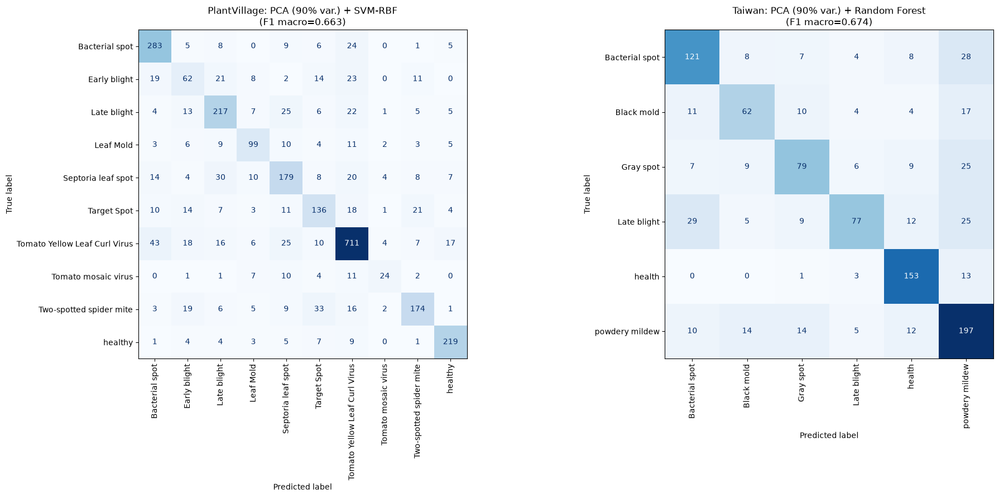

In [42]:
# Matriz de confusión para la mejor combinación (mayor F1 macro) de cada dataset
mejor_plantvillage = max(resultados_plantvillage, key=lambda r: r['F1 (macro)'])
mejor_taiwan = max(resultados_taiwan, key=lambda r: r['F1 (macro)'])

mejores_por_dataset = [
    ('PlantVillage', mejor_plantvillage, y_plantvillage_test, modelos_plantvillage),
    ('Taiwan', mejor_taiwan, y_taiwan_test, modelos_taiwan),
]

fig, axes = plt.subplots(1, 2, figsize=(20, 9))
for ax, (nombre_dataset, mejor, y_test_actual, modelos_dict) in zip(axes, mejores_por_dataset):
    _, y_pred = modelos_dict[(mejor['Representación'], mejor['Modelo'])]
    ConfusionMatrixDisplay.from_predictions(
        y_test_actual, y_pred, ax=ax, colorbar=False, cmap='Blues', xticks_rotation=90
    )
    ax.set_title(f"{nombre_dataset}: {mejor['Representación']} + {mejor['Modelo']}\n(F1 macro={mejor['F1 (macro)']:.3f})")
plt.tight_layout()
plt.show()

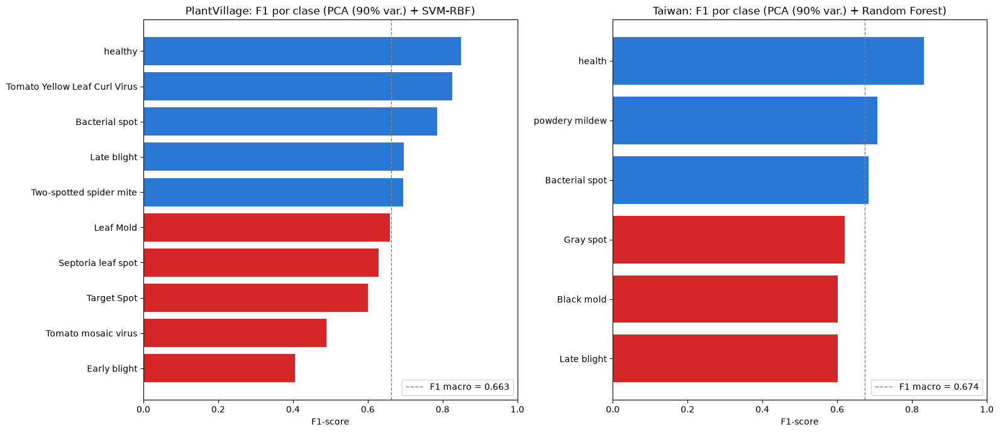

In [43]:
# F1-score por clase individual (no solo el macro) para el mejor modelo de cada dataset:
# el desbalance de clases puede hacer que el f1_macro oculte que una o dos clases minoritarias
# se están clasificando mal.
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, (nombre_dataset, mejor, y_test_actual, modelos_dict) in zip(axes, mejores_por_dataset):
    _, y_pred = modelos_dict[(mejor['Representación'], mejor['Modelo'])]
    clases = sorted(set(y_test_actual))
    f1_por_clase = f1_score(y_test_actual, y_pred, labels=clases, average=None)
    orden = np.argsort(f1_por_clase)
    clases_ordenadas = [clases[i] for i in orden]
    valores_ordenados = f1_por_clase[orden]
    colores = ['#d62728' if v < mejor['F1 (macro)'] else '#2a78d6' for v in valores_ordenados]
    ax.barh(clases_ordenadas, valores_ordenados, color=colores)
    ax.axvline(mejor['F1 (macro)'], color='gray', linestyle='--', linewidth=1,
               label=f"F1 macro = {mejor['F1 (macro)']:.3f}")
    ax.set_xlabel('F1-score')
    ax.set_xlim(0, 1)
    ax.set_title(f"{nombre_dataset}: F1 por clase ({mejor['Representación']} + {mejor['Modelo']})")
    ax.legend(loc='lower right')
plt.tight_layout()
plt.show()

<div style="border-left:4px solid #3D6FB0;padding:4px 0 6px 14px;margin:16px 0 6px 0;"><span style="background:#3D6FB0;color:#FFFFFF;border-radius:3px;padding:2px 9px;font-size:11px;letter-spacing:.6px;"></span><br/><span style="color:#3D6FB0;font-size:21px;font-weight:700;">6. Conclusiones </span></div>